# Import Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, BaggingClassifier, GradientBoostingClassifier
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelBinarizer
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RepeatedStratifiedKFold
from sklearn.metrics import roc_auc_score, precision_recall_fscore_support
from sklearn.metrics import precision_recall_curve, confusion_matrix, roc_curve, auc
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import *
from keras.layers import *
from sklearn.utils import class_weight
from sklearn.decomposition import PCA
from sklearn.metrics import f1_score

import scipy as sp
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, Activation
from tensorflow.keras import optimizers, initializers, callbacks
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix

from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

METRICS_BINARY = [keras.metrics.BinaryAccuracy(name='accuracy')]

METRICS = [
      keras.metrics.BinaryCrossentropy(name='cross entropy'),  # same as model's loss
      keras.metrics.MeanSquaredError(name='Brier score'),
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'),
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc'),
      keras.metrics.AUC(name='prc', curve='PR'),
      keras.metrics.CategoricalAccuracy(name='categorical_accuracy') # precision-recall curve
]

In [ ]:
path = "/Data/HRV_Sepsis.csv"
df = pd.read_csv(path)
df.columns = df.columns.str.replace(' ','')
print(df.shape)
df.head()


(4314, 59)


,SI>1,Sepsis3,Mean.rate,Coefficient.of.variation,Poincar..SD1,Poincar..SD2,LF.HF.ratio.LombScargle,LF.Power.LombScargle,HF.Power.LombScargle,DFA.Alpha.1,...,ARerr,histSI,MultiFractal_c1,MultiFractal_c2,SDLEalpha,SDLEmean,QSE,Hurst.exponent,mean,median
0,0,1,89.41116,0.130259,0.045349,0.115000,1.996490,0.165480,0.082885,0.360711,...,0.012382,97.90655,0.450963,-0.390230,0.098868,-0.068385,-3.370129,0.293162,0.014667,0.01
1,0,1,86.80576,0.026824,0.009504,0.024437,0.879037,0.111384,0.126711,1.045326,...,0.007553,97.16291,0.653894,-0.099736,0.002335,-0.070684,-3.613631,0.189769,0.018400,0.01
2,0,1,85.50767,0.035203,0.009715,0.033555,2.542225,0.258164,0.101550,1.191519,...,0.007291,96.94639,0.446524,-0.215889,-0.031113,-0.022195,-3.436350,0.842615,0.007567,0.01
3,0,1,95.12748,0.013182,0.006829,0.009571,1.596207,0.179256,0.112301,0.604070,...,0.005767,99.34581,0.409963,0.119166,-0.049628,-0.184725,-4.591196,0.916986,0.010100,0.01
4,0,1,93.37041,0.016777,0.006921,0.013585,1.128488,0.163068,0.144501,1.055573,...,0.005666,95.76449,0.478948,0.090387,-1.652177,-0.312528,-4.213691,0.680459,0.009867,0.01


In [ ]:
print(df["SI>1"].value_counts())
print(df["Sepsis3"].value_counts())

0    4071
1     243
Name: SI>1, dtype: int64
0    3776
1     538
Name: Sepsis3, dtype: int64


In [ ]:
df=df.rename(columns={"LF.HF.ratio.LombScargle":"LF.HF.ratio.LS"
,"LF.Power.LombScargle":"LF.Power.LS"
, "HF.Power.LombScargle":"HF.Power.LS"
,"Power.Law.Y.Intercept.LombScargle":"Power.Law.Y.Intercept.LS"
,"Power.Law.Slope.LombScargle":"Power.Law.Slope.LS"
,"VLF.Power.LombScargle":"VLF.Power.LS"})

In [ ]:
df.columns

Index(['SI>1', 'Sepsis3', 'Mean.rate', 'Coefficient.of.variation',
       'Poincar..SD1', 'Poincar..SD2', 'LF.HF.ratio.LS', 'LF.Power.LS',
       'HF.Power.LS', 'DFA.Alpha.1', 'DFA.Alpha.2',
       'Largest.Lyapunov.exponent', 'Correlation.dimension',
       'Power.Law.Slope.LS', 'Power.Law.Y.Intercept.LS', 'DFA.AUC',
       'Multiscale.Entropy', 'VLF.Power.LS', 'Complexity', 'eScaleE', 'pR',
       'pD', 'dlmax', 'sedl', 'pDpR', 'pL', 'vlmax', 'sevl', 'shannEn', 'PSeo',
       'Teo', 'SymDp0_2', 'SymDp1_2', 'SymDp2_2', 'SymDfw_2', 'SymDse_2',
       'SymDce_2', 'formF', 'gcount', 'sgridAND', 'sgridTAU', 'sgridWGT',
       'aFdP', 'fFdP', 'IoV', 'KLPE', 'AsymI', 'CSI', 'CVI', 'ARerr', 'histSI',
       'MultiFractal_c1', 'MultiFractal_c2', 'SDLEalpha', 'SDLEmean', 'QSE',
       'Hurst.exponent', 'mean', 'median'],
      dtype='object')

In [ ]:
import pandas as pd

# Assuming `df` is your original DataFrame

# List all the columns and remove 'Sepsis3' and 'SI>1' from the list
cols = df.columns.tolist()
cols.remove('Sepsis3')
cols.remove('SI>1')

# Add 'Sepsis3' at the beginning and 'SI>1' as the second column
new_order = ['Sepsis3', 'SI>1'] + cols

# Reindex the DataFrame with the new order of columns
new_df = df[new_order]

In [ ]:
X_t, X_v, y_t, y_v = train_test_split(df.iloc[:,2:].values, df.iloc[:,1].values, test_size=0.2,
                                      stratify=df.iloc[:,1].values, random_state=0)

    X_t: The features for the training set.
    X_v: The features for the validation (or test) set.
    y_t: The corresponding labels for the training set.
    y_v: The corresponding labels for the validation (or test) set.

In [ ]:
X_t_means = np.mean(X_t, axis=0)
X_t_stds = np.std(X_t, axis=0)

X_t = (X_t - X_t_means) / X_t_stds
X_v = (X_v - X_t_means) / X_t_stds

In [ ]:
def normalize_data(X, y, normalizer='StandardScaler'):
    if normalizer == 'StandardScaler':
        scaler = StandardScaler()
    elif normalizer == 'MinMaxScaler':
        scaler = MinMaxScaler()
    elif normalizer == 'RobustScaler':
        scaler = RobustScaler()
    else:
        raise ValueError(f'Invalid normalizer: {normalizer}')

    X_scaled = scaler.fit_transform(X)
    return X_scaled, y

# Statistical Analysis1 - Perform T-test for all features

In [ ]:
from scipy.stats import ttest_ind
all_features = cols
binary_dependent_variable = new_df.iloc[:, 0]
group1 = new_df[binary_dependent_variable == 0]
group2 = new_df[binary_dependent_variable == 1]



# Perform t-tests for all features
t_test_results = {}

for feature in all_features:

    if feature in df.columns:
        group1_data = group1[feature]
        group2_data = group2[feature]
        t_stat, p_value = ttest_ind(group1_data, group2_data, nan_policy='omit')  # 'omit' will ignore NaNs
        t_test_results[feature] = {'t_stat': t_stat, 'p_value': p_value}

# Convert the results dictionary to a dataframe
t_test_results_df = pd.DataFrame.from_dict(t_test_results, orient='index')


print(t_test_results_df)



                              t_stat        p_value
Mean.rate                  10.875340   3.396291e-27
Coefficient.of.variation  -11.176121   1.314930e-28
Poincar..SD1              -15.068272   4.824392e-50
Poincar..SD2              -14.135262   2.224678e-44
LF.HF.ratio.LS              4.821928   1.470765e-06
LF.Power.LS                -5.284034   1.326082e-07
HF.Power.LS                -3.757338   1.739997e-04
DFA.Alpha.1                 2.643343   8.238899e-03
DFA.Alpha.2                 8.110745   6.498174e-16
Largest.Lyapunov.exponent   2.889384   3.879221e-03
Correlation.dimension       2.134251   3.287851e-02
Power.Law.Slope.LS        -15.190476   8.272965e-51
Power.Law.Y.Intercept.LS  -14.074718   5.052992e-44
DFA.AUC                   -17.333321   4.056460e-65
Multiscale.Entropy         -1.556411   1.196839e-01
VLF.Power.LS               15.757471   1.962808e-54
Complexity                 11.831723   8.268107e-32
eScaleE                     3.277459   1.055756e-03
pR          

In [ ]:
# Reset the index to turn the index into a column
t_test_results_df_reset = t_test_results_df.reset_index()

# Rename the columns
t_test_results_df_reset.columns = ['Feature', 't_stat', 'p_value']

# Save the DataFrame with the feature name to a CSV file
output_file_path = 't_test_sepsis.csv'
t_test_results_df_reset.to_csv(output_file_path, index=False)

In [ ]:
import plotly.graph_objects as go

# Data for the sepsis features, t-statistics, and p-values copied from the CSV file saved
# from the previous step
data_sepsis_ttest = {
    'Feature': [
        'Mean.rate', 'Coefficient.of.variation', 'Poincar..SD1', 'Poincar..SD2',
        'LF.HF.ratio.LS', 'LF.Power.LS', 'HF.Power.LS',
        'DFA.Alpha.1', 'DFA.Alpha.2', 'Largest.Lyapunov.exponent',
        'Correlation.dimension', 'Power.Law.Slope.LS',
        'Power.Law.Y.Intercept.LS', 'DFA.AUC', 'Multiscale.Entropy',
        'VLF.Power.LS', 'Complexity', 'eScaleE', 'pR', 'pD',
        'dlmax', 'sedl', 'pDpR', 'pL', 'vlmax', 'sevl', 'shannEn',
        'PSeo', 'Teo', 'SymDp0_2', 'SymDp1_2', 'SymDp2_2', 'SymDfw_2',
        'SymDse_2', 'SymDce_2', 'formF', 'gcount', 'sgridAND', 'sgridTAU',
        'sgridWGT', 'aFdP', 'fFdP', 'IoV', 'KLPE', 'AsymI', 'CSI', 'CVI',
        'ARerr', 'histSI', 'MultiFractal_c1', 'MultiFractal_c2', 'SDLEalpha',
        'SDLEmean', 'QSE', 'Hurst.exponent', 'mean', 'median'
    ],
    't_stat': [
        10.87533968, -11.17612084, -15.06827204, -14.13526196, 4.821927812,
        -5.284034021, -3.757338241, 2.643342524, 8.110745265, 2.889384253,
        2.134250738, -15.19047639, -14.07471805, -17.33332099, -1.556410673,
        15.75747087, 11.83172259, 3.277459185, -3.917943493, 0.103044549,
        -2.165613643, 3.799061476, 5.700108122, -1.081799111, -7.298372658,
        0.932690088, 2.466739116, -15.46232999, -15.9452476, 10.73323268,
        -12.68348681, -6.680077953, 10.05798259, -12.08446134, -9.022648451,
        8.015913825, 17.53655772, 17.89333274, -10.76146314, -11.1841164,
        -23.74501457, -24.79094201, -11.98965286, 11.30652953, 7.828346451,
        7.984348855, -14.44243982, -7.646135744, 6.386629769, -7.431594267,
        2.689242047, -3.291488132, -3.037057735, -11.41088745, -11.42887849,
        -11.76222594, -10.2294111
    ],
    'p_value': [
        3.40E-27, 1.31E-28, 4.82E-50, 2.22E-44, 1.47E-06, 1.33E-07,
        0.000174, 0.008238899, 6.50E-16, 0.003879221, 0.032878509,
        8.27E-51, 5.05E-44, 4.06E-65, 0.119683856, 1.96E-54, 8.27E-32,
        0.001055756, 9.07E-05, 0.917932406, 0.030395372, 0.000147246,
        1.28E-08, 0.279402296, 3.45E-13, 0.351032224, 0.013673565,
        1.56E-52, 1.17E-55, 1.53E-26, 3.21E-36, 2.69E-11, 1.54E-23,
        4.35E-33, 2.71E-19, 1.40E-15, 1.47E-66, 3.97E-69, 1.14E-26,
        1.20E-28, 3.07E-117, 5.93E-127, 1.32E-32, 3.13E-29, 6.18E-15,
        1.80E-15, 3.30E-46, 2.54E-14, 1.88E-10, 1.29E-13, 0.007189008,
        0.001004609, 0.002403288, 9.82E-30, 8.03E-30, 1.84E-31, 2.77E-24
    ]
}

# Create the DataFrame
df_sepsis = pd.DataFrame(data_sepsis_ttest)

# Calculate -log10 of p-value for the plot
df_sepsis['-log10(p_value)'] = -np.log10(df_sepsis['p_value'])

#Sort in ascending order of p-value
df_sepsis = df_sepsis.sort_values(by='p_value', ascending=True)


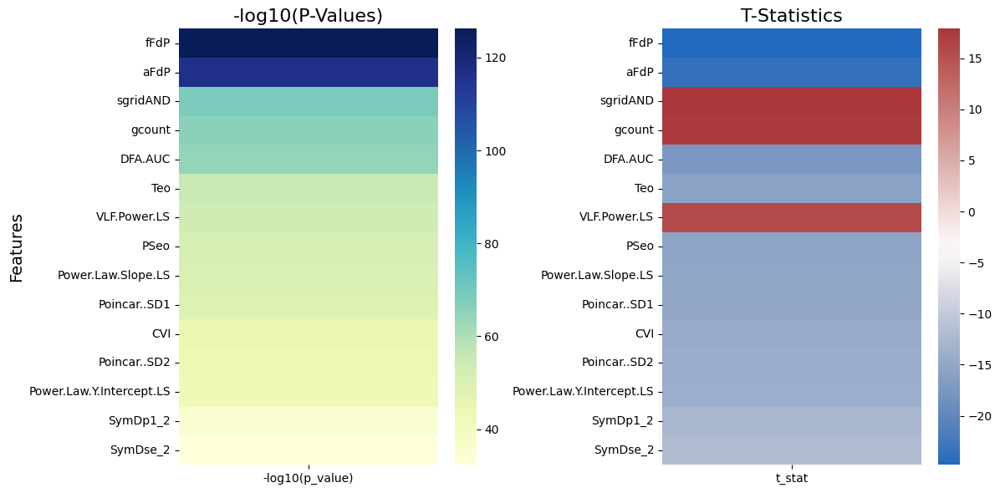

In [ ]:
# Select the top 15 features based on the smallest p-values
top_features = df_sepsis.head(15)  # This now contains the top 15 features

# Prepare the data for the heatmap - Use the 'top_features' subset for this
heatmap_data_p_values = top_features['-log10(p_value)'].to_frame().set_index(top_features['Feature'])
heatmap_data_t_stats = top_features['t_stat'].to_frame().set_index(top_features['Feature'])

# Set up the matplotlib figure with two plots side by side
fig, axes = plt.subplots(ncols=2, figsize=(12, 6))

# Plot the heatmaps for the top 15 features
sns.heatmap(heatmap_data_p_values, cmap='YlGnBu', cbar=True, ax=axes[0])
sns.heatmap(heatmap_data_t_stats, cmap='vlag', cbar=True, ax=axes[1])

# Customize the plots
axes[0].set_title('-log10(P-Values)', fontsize=16)
axes[0].set_ylabel('Features', fontsize=14)
axes[0].set_xlabel('')

axes[1].set_title('T-Statistics', fontsize=16)
axes[1].set_ylabel('')
axes[1].set_xlabel('')

plt.tight_layout()
#plt.show()
plt.savefig('SA1.png', bbox_inches='tight')

In [ ]:
feature_list =top_features['Feature'].tolist()

In [ ]:
print(feature_list)

['fFdP', 'aFdP', 'sgridAND', 'gcount', 'DFA.AUC', 'Teo', 'VLF.Power.LS', 'PSeo', 'Power.Law.Slope.LS', 'Poincar..SD1', 'CVI', 'Poincar..SD2', 'Power.Law.Y.Intercept.LS', 'SymDp1_2', 'SymDse_2']


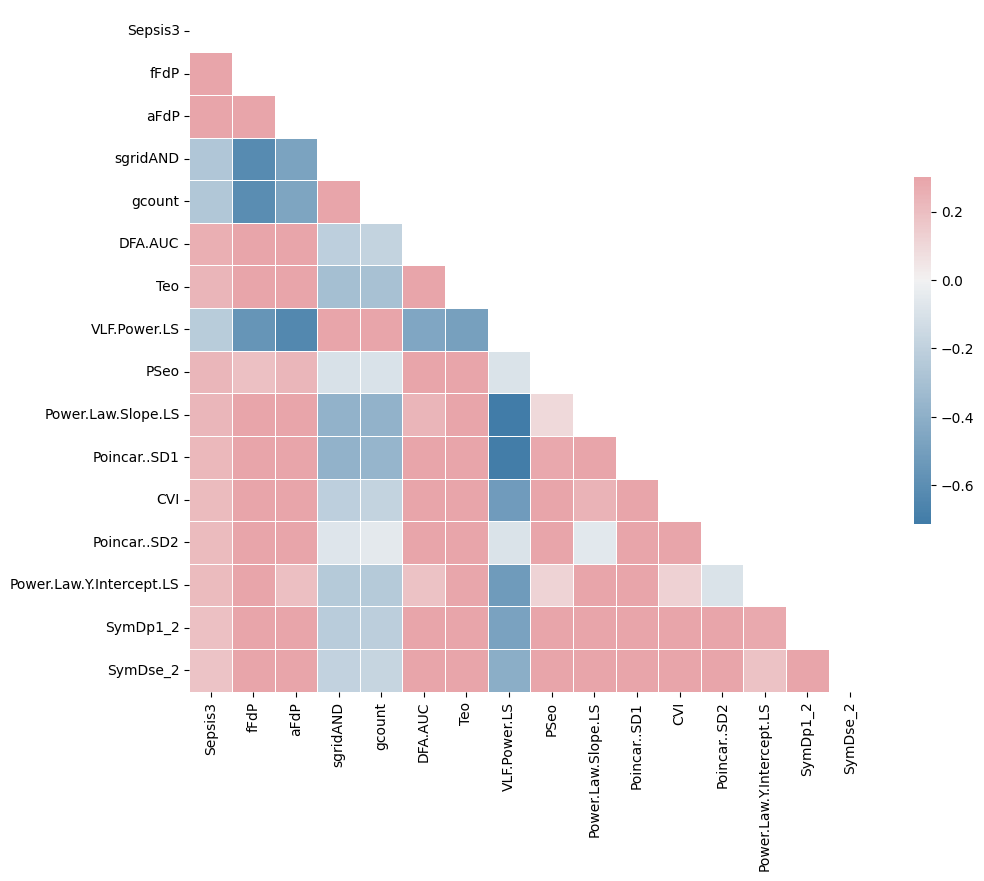

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


columns_to_keep = ['Sepsis3','fFdP', 'aFdP', 'sgridAND', 'gcount',
                   'DFA.AUC', 'Teo', 'VLF.Power.LS', 'PSeo',
                   'Power.Law.Slope.LS', 'Poincar..SD1', 'CVI',
                   'Poincar..SD2', 'Power.Law.Y.Intercept.LS',
                   'SymDp1_2', 'SymDse_2']

# Create a new DataFrame with only the selected columns
df_new = df[columns_to_keep]

# Compute the correlation matrix
corr = df_new.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(240, 10,n=9, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Save the figure with a higher resolution
plt.savefig('correlation_heatmap.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

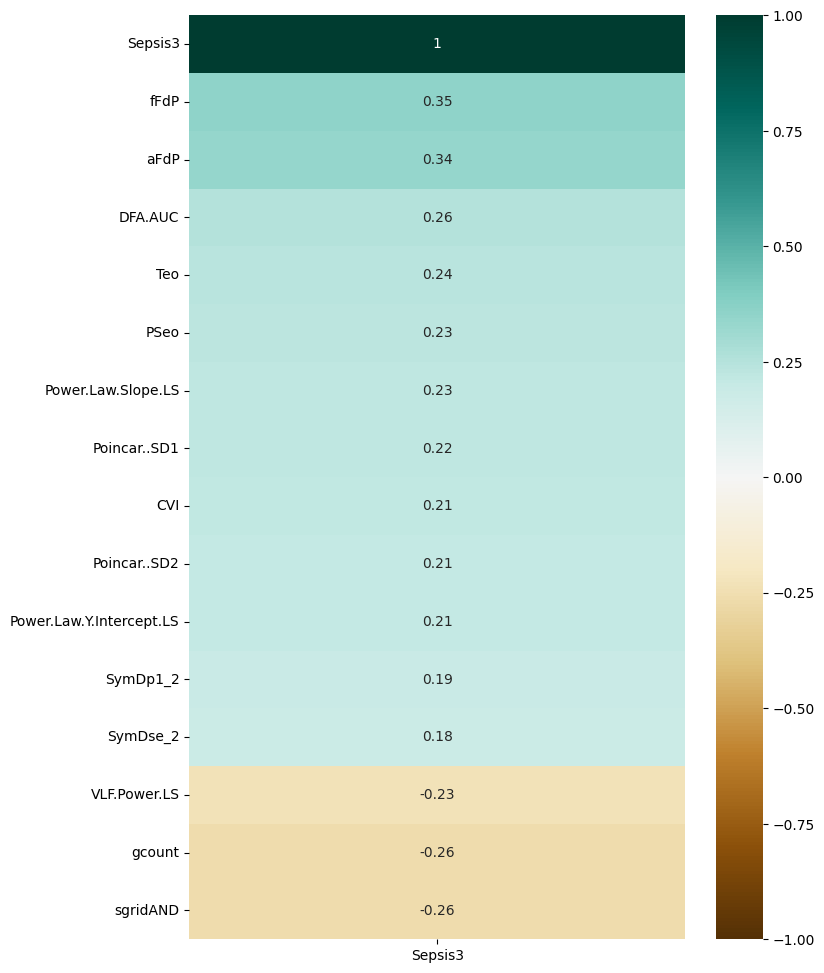

In [ ]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(df_new.corr()[['Sepsis3']].sort_values(by='Sepsis3', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
#heatmap.set_title('Features Correlating with Peaceful', fontdict={'fontsize':18}, pad=16);
plt.savefig('correlation_features.png', dpi=300, bbox_inches='tight')

In [ ]:
# Plotly graph
top_features = df_sepsis
fig = go.Figure(go.Bar(
    x=top_features['-log10(p_value)'],
    y=top_features['Feature'],
    orientation='h'
))


fig.update_yaxes(autorange="reversed")  # This reverses the bar order

fig.update_layout(
    title='Feature Significance for Sepsis based on p-value - Top 15 Features',
    xaxis_title='-log10(p-value)',
    yaxis_title='Features',
    xaxis=dict(
        title='-log10(p-value)',
        titlefont_size=16,
        tickfont_size=14,
    ),
    yaxis=dict(
        title='Features',
        titlefont_size=16,
        tickfont_size=14,
    )
)

fig.show()


# Statistical Analysis 2 - Bootstrapping for Sepsis3 for all features

Bootstrapping is a statistical technique that allows for estimating the distribution of a statistic by resampling with replacement from the original sample. By resampling many times, we can calculate a p-value using the Central Limit Theorem, which tells us that with a large enough sample size, the sampling distribution of the mean will be normally distributed, regardless of the distribution of the original data.

In [ ]:
new_df.head(5)

,Sepsis3,SI>1,Mean.rate,Coefficient.of.variation,Poincar..SD1,Poincar..SD2,LF.HF.ratio.LS,LF.Power.LS,HF.Power.LS,DFA.Alpha.1,...,ARerr,histSI,MultiFractal_c1,MultiFractal_c2,SDLEalpha,SDLEmean,QSE,Hurst.exponent,mean,median
0,1,0,89.41116,0.130259,0.045349,0.115000,1.996490,0.165480,0.082885,0.360711,...,0.012382,97.90655,0.450963,-0.390230,0.098868,-0.068385,-3.370129,0.293162,0.014667,0.01
1,1,0,86.80576,0.026824,0.009504,0.024437,0.879037,0.111384,0.126711,1.045326,...,0.007553,97.16291,0.653894,-0.099736,0.002335,-0.070684,-3.613631,0.189769,0.018400,0.01
2,1,0,85.50767,0.035203,0.009715,0.033555,2.542225,0.258164,0.101550,1.191519,...,0.007291,96.94639,0.446524,-0.215889,-0.031113,-0.022195,-3.436350,0.842615,0.007567,0.01
3,1,0,95.12748,0.013182,0.006829,0.009571,1.596207,0.179256,0.112301,0.604070,...,0.005767,99.34581,0.409963,0.119166,-0.049628,-0.184725,-4.591196,0.916986,0.010100,0.01
4,1,0,93.37041,0.016777,0.006921,0.013585,1.128488,0.163068,0.144501,1.055573,...,0.005666,95.76449,0.478948,0.090387,-1.652177,-0.312528,-4.213691,0.680459,0.009867,0.01


In [ ]:
new_df.shape

(4314, 59)

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind
from sklearn.utils import resample



# The first column of the dataframe is the dependent binary variable -> Sepsis3
binary_dependent_variable = new_df.iloc[:, 0]

# Define two groups based on the binary dependent variable
group1 = new_df[binary_dependent_variable == 0]
group2 = new_df[binary_dependent_variable == 1]


features_all = new_df.columns[1:]

# Perform bootstrapping to get p-values
bootstrap_results = {}

for feature in features_all:
    # Data for this feature
    data1 = group1[feature].dropna()  # Removing NaNs
    data2 = group2[feature].dropna()  # Removing NaNs

    # Combine data to resample from
    combined_data = np.concatenate([data1, data2])
    diff_of_means = np.mean(data2) - np.mean(data1)  # The observed difference in means

    # Bootstrapping
    boot_diffs = []
    for _ in range(10000):  # Number of bootstraps
        boot_group1 = resample(combined_data, n_samples=len(data1))
        boot_group2 = resample(combined_data, n_samples=len(data2))
        boot_diffs.append(np.mean(boot_group2) - np.mean(boot_group1))

    # Calculate the p-value
    p_value = np.mean(np.abs(boot_diffs) >= np.abs(diff_of_means))
    bootstrap_results[feature] = {'diff_of_means': diff_of_means, 'bootstrap_p_value': p_value}

# Convert the results dictionary to a dataframe for convenient viewing
bootstrap_results_df = pd.DataFrame.from_dict(bootstrap_results, orient='index')
print(bootstrap_results_df)

KeyboardInterrupt: 

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind
from sklearn.utils import resample



# The first column of the dataframe is the dependent binary variable -> Sepsis3
binary_dependent_variable = new_df.iloc[:, 0]

# Define two groups based on the binary dependent variable
group1 = new_df[binary_dependent_variable == 0]
group2 = new_df[binary_dependent_variable == 1]

features_all = new_df.columns[1:]

# Perform bootstrapping to get p-values
bootstrap_results = {}

for feature in features_all:
    # Data for this feature
    data1 = group1[feature].dropna()  # Removing NaNs
    data2 = group2[feature].dropna()  # Removing NaNs

    # Combine data to resample from
    combined_data = np.concatenate([data1, data2])

    # Calculate the overall mean from the combined data
    overall_mean = np.mean(combined_data)

    diff_of_means = np.mean(data2) - np.mean(data1)  # The observed difference in means
    percent_diff_of_means = (diff_of_means / overall_mean) * 100  # Percentage difference based on overall mean

    # Bootstrapping
    boot_perc_diffs = []
    for _ in range(10000):  # Number of bootstraps
        boot_group1 = resample(combined_data, n_samples=len(data1))
        boot_group2 = resample(combined_data, n_samples=len(data2))
        boot_diff = (np.mean(boot_group2) - np.mean(boot_group1)) / overall_mean * 100
        boot_perc_diffs.append(boot_diff)

    # Calculate the p-value
    p_value = np.mean(np.abs(boot_perc_diffs) >= np.abs(percent_diff_of_means))
    bootstrap_results[feature] = {'percent_diff_of_means': percent_diff_of_means, 'bootstrap_p_value': p_value}

# Convert the results dictionary to a dataframe for convenient viewing
bootstrap_results_df = pd.DataFrame.from_dict(bootstrap_results, orient='index')
print(bootstrap_results_df)

                           percent_diff_of_means  bootstrap_p_value
SI>1                                  -31.308188             0.0994
Mean.rate                              -9.204759             0.0000
Coefficient.of.variation               31.175676             0.0000
Poincar..SD1                           51.252486             0.0000
Poincar..SD2                           46.341354             0.0000
LF.HF.ratio.LS                        -25.846654             0.0000
LF.Power.LS                            13.147107             0.0000
HF.Power.LS                            14.721436             0.0001
DFA.Alpha.1                            -4.004986             0.0086
DFA.Alpha.2                            -9.371964             0.0000
Largest.Lyapunov.exponent              -8.662659             0.0042
Correlation.dimension                  -3.756970             0.0331
Power.Law.Slope.LS                    -28.298634             0.0000
Power.Law.Y.Intercept.LS               10.994283

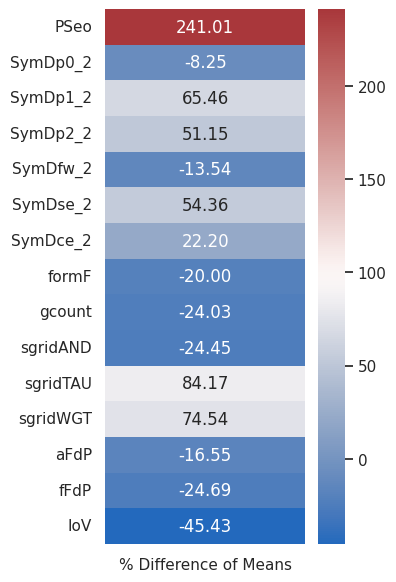

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


df_sepsis_boot = bootstrap_results_df.sort_values('bootstrap_p_value', ascending=True)

# Select the top 15 features based on the smallest p-values
top_features_boot = df_sepsis_boot.head(15)  # This now contains the top 15 features

heatmap_data_percent_diff_of_means = top_features_boot['percent_diff_of_means'].to_frame().set_index(top_features_boot.index[:15])

# Set up the matplotlib figure
plt.figure(figsize=(4, 6))  # Adjusted for a possibly longer y-axis due to more features labels

# Plot the heatmap for the top 15 features' percentage difference of means
sns.heatmap(heatmap_data_percent_diff_of_means, cmap='vlag', cbar=True, annot=True, fmt=".2f")

# Customize the plot
#plt.title('Percentage Difference of Means', fontsize=16)
plt.ylabel('')  # Optional: define if you want a label for the y-axis

# Adjust layout for better visualization
plt.tight_layout()

# Save the figure
plt.xticks(ticks=[0.5], labels=['% Difference of Means'])

# Show the plot
plt.savefig("Fig3-percent-diff-of-means.png", format='png', dpi=300, bbox_inches='tight')
plt.show()

Statistically Significant Variables (p < 0.05):

    Mean.rate
    Coefficient.of.variation
    Poincar..SD1
    Poincar..SD2
    LF.HF.ratio.LS
    LF.Power.LS
    HF.Power.LS
    DFA.Alpha.1
    DFA.Alpha.2
    Largest.Lyapunov.exponent
    Correlation.dimension
    Power.Law.Slope.LS
    Power.Law.Y.Intercept.LS
    DFA.AUC
    VLF.Power.LS
    Complexity
    eScaleE
    pR
    dlmax
    sedl
    pDpR
    vlmax
    shannEn
    PSeo
    Teo
    SymDp0_2
    SymDp1_2
    SymDp2_2
    SymDfw_2
    SymDse_2
    SymDce_2
    formF
    gcount
    sgridAND
    sgridTAU
    sgridWGT
    aFdP
    fFdP
    IoV
    KLPE
    AsymI
    CSI
    CVI
    ARerr
    histSI
    MultiFractal_c1
    MultiFractal_c2
    SDLEalpha
    SDLEmean
    QSE
    Hurst.exponent
    mean
    median

Non-Statistically Significant Variables (p ≥ 0.05):

    Multiscale.Entropy
    pD
    pL
    sevl
    SI>1

## Plot Graphs for Paper using Bootstrap p_value and difference of mean

In [ ]:
# List of feature names
data_sepsis_boot = {
'Feature' : [
    "Mean.rate", "Coefficient.of.variation", "Poincar..SD1", "Poincar..SD2",
    "LF.HF.ratio.LS", "LF.Power.LS", "HF.Power.LS",
    "DFA.Alpha.1", "DFA.Alpha.2", "Largest.Lyapunov.exponent",
    "Correlation.dimension", "Power.Law.Slope.LS",
    "Power.Law.Y.Intercept.LS", "DFA.AUC", "Multiscale.Entropy",
    "VLF.Power.LS", "Complexity", "eScaleE", "pR", "pD",
    "dlmax", "sedl", "pDpR", "pL", "vlmax", "sevl", "shannEn", "PSeo",
    "Teo", "SymDp0_2", "SymDp1_2", "SymDp2_2", "SymDfw_2", "SymDse_2",
    "SymDce_2", "formF", "gcount", "sgridAND", "sgridTAU", "sgridWGT",
    "aFdP", "fFdP", "IoV", "KLPE", "AsymI", "CSI", "CVI", "ARerr",
    "histSI", "MultiFractal_c1", "MultiFractal_c2", "SDLEalpha",
    "SDLEmean", "QSE", "Hurst.exponent", "mean", "median"
],
'Diff_of_Means' : [
    -8.240215055, 0.012150827, 0.006295956, 0.016895439, -0.62656606,
    0.014643639, 0.013033055, -0.04266945, -0.102439364, -0.004998493,
    -0.178662235, 0.353800698, 0.48438319, 0.364979128, 0.028043987,
    -0.118797602, -40.978954, -0.000202408, 1.063116032, -0.094215324,
    0.007624541, -0.148127828, -0.521441844, 1.132687025, 0.015824314,
    -0.04928707, -0.084818859, 0.000185576, 0.000317584, -0.072639148,
    0.052109216, 0.020529932, -2.395660718, 0.524943662, 0.150116842,
    -0.645462903, -0.690130082, -0.641160873, 0.120723224, 0.119677694,
    0.073051552, 0.131794189, 0.189963086, -0.014914318, -0.046139726,
    -0.914554157, 0.36458631, 0.002273078, -0.387731531, 0.050481701,
    -0.029034371, 0.072597277, 0.02734795, 0.344283311, 0.144613806,
    0.014397177, 0.01096766
]
,
'p_value' : [
    0, 0, 0, 0, 0, 0, 0.0002, 0.007, 0, 0.0037,
    0.0329, 0, 0, 0, 0.1137, 0, 0, 0.0011, 0.0002,
    0.9146, 0.0321, 0.0003, 0, 0.2861, 0, 0.3538,
    0.0152, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
    0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.007, 0.0017,
    0.0028, 0, 0, 0, 0
]
}

# Create the DataFrame
df_sepsis_boot = pd.DataFrame(data_sepsis_boot)

#Sort in ascending order of p-value
df_sepsis_boot = df_sepsis_boot.sort_values(by='p_value', ascending=True)



In [ ]:
df_sepsis_boot.head(5)

,Feature,Diff_of_Means,p_value
0,Mean.rate,-8.240215,0.0
29,SymDp0_2,-0.072639,0.0
30,SymDp1_2,0.052109,0.0
31,SymDp2_2,0.020530,0.0
32,SymDfw_2,-2.395661,0.0


In [ ]:

feature_means = new_df.mean()

# Create the list of feature names as provided
features = [
    "Mean.rate", "Coefficient.of.variation", "Poincar..SD1", "Poincar..SD2",
    "LF.HF.ratio.LS", "LF.Power.LS", "HF.Power.LS",
    "DFA.Alpha.1", "DFA.Alpha.2", "Largest.Lyapunov.exponent",
    "Correlation.dimension", "Power.Law.Slope.LS",
    "Power.Law.Y.Intercept.LS", "DFA.AUC", "Multiscale.Entropy",
    "VLF.Power.LS", "Complexity", "eScaleE", "pR", "pD",
    "dlmax", "sedl", "pDpR", "pL", "vlmax", "sevl", "shannEn", "PSeo",
    "Teo", "SymDp0_2", "SymDp1_2", "SymDp2_2", "SymDfw_2", "SymDse_2",
    "SymDce_2", "formF", "gcount", "sgridAND", "sgridTAU", "sgridWGT",
    "aFdP", "fFdP", "IoV", "KLPE", "AsymI", "CSI", "CVI", "ARerr",
    "histSI", "MultiFractal_c1", "MultiFractal_c2", "SDLEalpha",
    "SDLEmean", "QSE", "Hurst.exponent", "mean", "median"
]

# Extract the mean values for the features in the specified order
mean_values_list = [feature_means[feature] for feature in features]


mean_values_structured = {
    'Feature': features,
    'Mean_Values': mean_values_list
}


mean_values_df = pd.DataFrame(mean_values_structured)

mean_values_df

,Feature,Mean_Values
0,Mean.rate,89.521243
1,Coefficient.of.variation,0.038975
2,Poincar..SD1,0.012284
3,Poincar..SD2,0.036459
4,LF.HF.ratio.LS,2.424167
5,LF.Power.LS,0.111383
6,HF.Power.LS,0.088531
7,DFA.Alpha.1,1.065408
8,DFA.Alpha.2,1.093041
9,Largest.Lyapunov.exponent,0.057702


In [ ]:
import pandas as pd


# Merge the mean_values_df into df_sepsis_boot on 'Feature'
df_sepsis_boot_with_means = pd.merge(df_sepsis_boot, mean_values_df, on='Feature', how='left')


print(df_sepsis_boot_with_means.head())  # Display the first few rows to check the updated DataFrame

     Feature  Diff_of_Means  p_value  Mean_Values
0  Mean.rate      -8.240215      0.0    89.521243
1   SymDp0_2      -0.072639      0.0     0.880250
2   SymDp1_2       0.052109      0.0     0.079610
3   SymDp2_2       0.020530      0.0     0.040140
4   SymDfw_2      -2.395661      0.0    17.695410


In [ ]:
df_sepsis_boot_with_means['Percentage_Difference'] = (df_sepsis_boot_with_means['Diff_of_Means'] / df_sepsis_boot_with_means['Mean_Values']) * 100

In [ ]:
print(df_sepsis_boot_with_means.head())

     Feature  Diff_of_Means  p_value  Mean_Values  Percentage_Difference
0  Mean.rate      -8.240215      0.0    89.521243              -9.204759
1   SymDp0_2      -0.072639      0.0     0.880250              -8.252102
2   SymDp1_2       0.052109      0.0     0.079610              65.455408
3   SymDp2_2       0.020530      0.0     0.040140              51.146421
4   SymDfw_2      -2.395661      0.0    17.695410             -13.538317


In [ ]:

# Sort the DataFrame in descending order of p-value
df_sepsis_boot_with_means_sorted = df_sepsis_boot_with_means.sort_values(by='p_value', ascending=True)

# Select the top 15 features
top_15_features = df_sepsis_boot_with_means_sorted.head(15)


print(top_15_features)

                     Feature  Diff_of_Means  p_value  Mean_Values  \
0                  Mean.rate      -8.240215      0.0    89.521243   
23            Hurst.exponent       0.144614      0.0     0.414670   
24                      mean       0.014397      0.0     0.025879   
25                      PSeo       0.000186      0.0     0.000077   
26                       Teo       0.000318      0.0     0.000278   
27        Power.Law.Slope.LS       0.353801      0.0    -1.250239   
29              Poincar..SD1       0.006296      0.0     0.012284   
30              Poincar..SD2       0.016895      0.0     0.036459   
31            LF.HF.ratio.LS      -0.626566      0.0     2.424167   
32               LF.Power.LS       0.014644      0.0     0.111383   
33               DFA.Alpha.2      -0.102439      0.0     1.093041   
34  Power.Law.Y.Intercept.LS       0.484383      0.0     4.405773   
35                   DFA.AUC       0.364979      0.0    -2.203979   
36              VLF.Power.LS      

In [ ]:
df_sepsis_boot_with_means_sorted.head(15)

,Feature,Diff_of_Means,p_value,Mean_Values,Percentage_Difference
0,Mean.rate,-8.240215,0.0,89.521243,-9.204759
23,Hurst.exponent,0.144614,0.0,0.414670,34.874424
24,mean,0.014397,0.0,0.025879,55.632467
25,PSeo,0.000186,0.0,0.000077,241.005616
26,Teo,0.000318,0.0,0.000278,114.142152
27,Power.Law.Slope.LS,0.353801,0.0,-1.250239,-28.298634
29,Poincar..SD1,0.006296,0.0,0.012284,51.252488
30,Poincar..SD2,0.016895,0.0,0.036459,46.341353
31,LF.HF.ratio.LS,-0.626566,0.0,2.424167,-25.846654
32,LF.Power.LS,0.014644,0.0,0.111383,13.147108


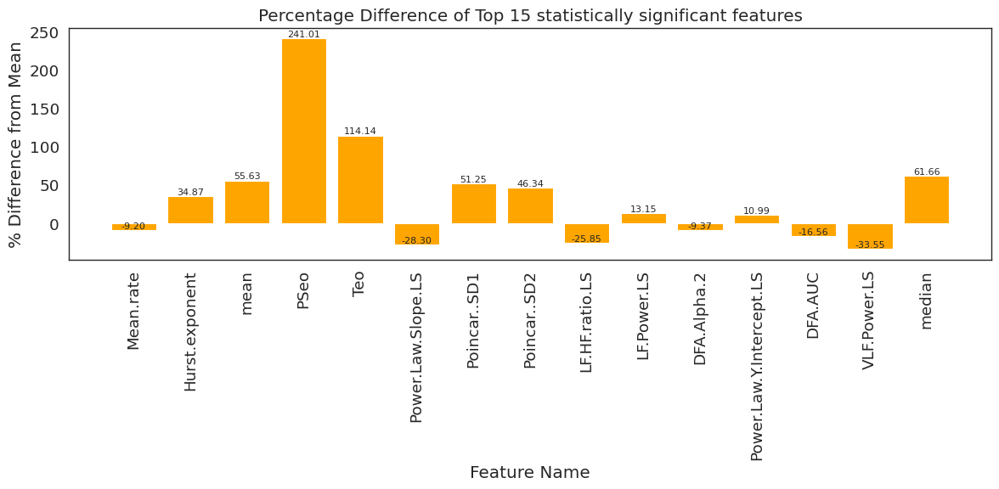

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd



# Set figure size for the plot
plt.figure(figsize=(12, 6))

# Generate the bar plot
bar_colors = ['orange' if p < 0.05 else 'blue' for p in top_15_features['p_value']]
bars = plt.bar(top_15_features['Feature'], top_15_features['Percentage_Difference'], color=bar_colors)

# Annotate each bar with its exact value (percentage difference)
for bar in bars:
    yval = bar.get_height()  # Get the height of the bar, which corresponds to the percentage difference
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:.2f}", ha='center', va='bottom', rotation=0, fontsize=8)

# Improve layout for visibility
plt.xticks(rotation=90)
plt.xlabel('Feature Name')
plt.ylabel('% Difference from Mean')
plt.title('Percentage Difference of Top 15 statistically significant features')
plt.tight_layout()

# Display the plot
plt.show()

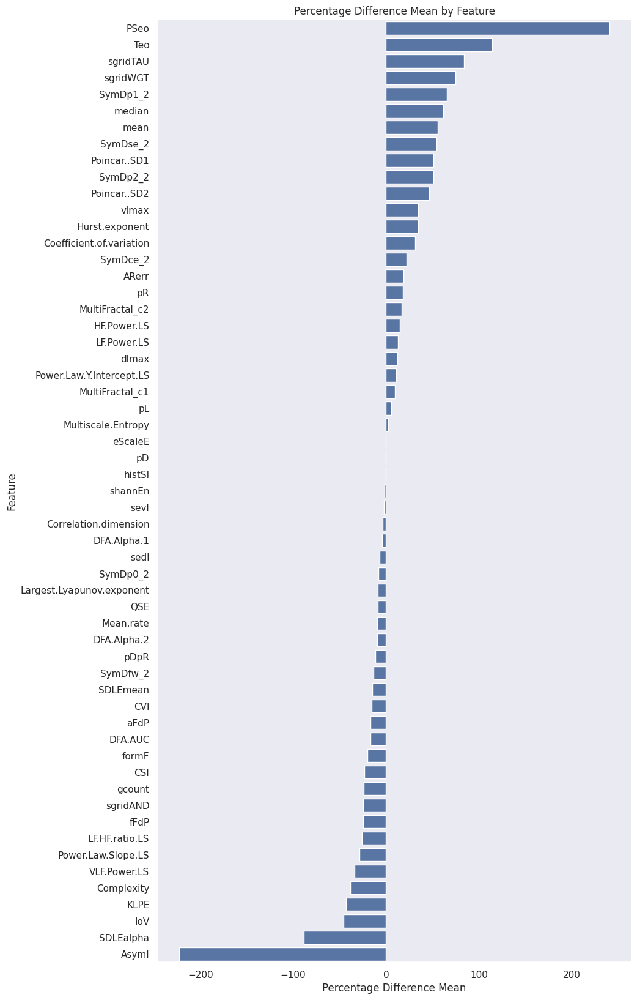

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


df_sepsis_boot.set_index('Feature', inplace=True)

# Sort the DataFrame based on 'Percentage_Diff_Mean' to have a more readable plot
df_sorted = df_sepsis_boot.sort_values(by='Percentage_Diff_Mean', ascending=False)

# Plotting
plt.figure(figsize=(10, 20))

# Generating a bar plot
sns.barplot(y=df_sorted.index, x='Percentage_Diff_Mean', data=df_sorted)

plt.title("Percentage Difference Mean by Feature")
plt.xlabel("Percentage Difference Mean")
plt.ylabel("Feature")

plt.show()

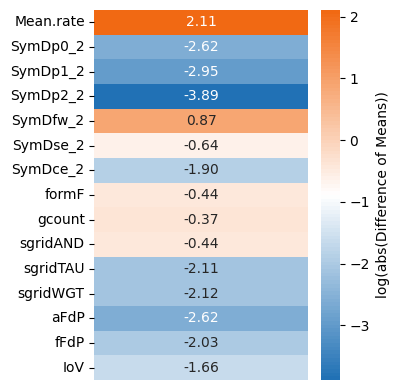

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import LinearSegmentedColormap



# Select the top 15 features based on the smallest p-values
top_features_boot = df_sepsis_boot.head(15)

# Prepare the data for the heatmap - Take the log of the absolute value of the 'Diff_of_Means'
heatmap_data_diff_of_means = np.log(np.abs(top_features_boot['Diff_of_Means'])).to_frame().set_index(top_features_boot['Feature'][:15])

# Set up the matplotlib figure
plt.figure(figsize=(4, 4))  # Adjusted for better legibility in print

# Creating a custom colormap using professional blue and orange
colors = ["#2171b5", "#ffffff", "#f16913"]  # Blue, white (neutral midpoint), Orange
n_bins = 100  # Use more bins for a smoother transition
cmap = LinearSegmentedColormap.from_list("custom", colors, N=n_bins)

# Plot the heatmap for the transformed top 15 features' values with the custom colormap
sns.heatmap(heatmap_data_diff_of_means, cmap=cmap, cbar_kws={'label': 'log(abs(Difference of Means))'}, annot=True, fmt=".2f", annot_kws={"size": 10})

# Customize the plot
plt.xticks([])  # Hide x-axis labels and ticks
plt.yticks(rotation=0, fontsize=10)  # Ensure y-tick labels are horizontal for readability
plt.ylabel('')  # Removing the y-axis label for cleaner presentation
plt.xlabel('')

plt.tight_layout()

# Save and show the figure
plt.savefig("Fig3-log-abs-diff-of-means.png", format='png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
feature_list_boot =top_features_boot['Feature'].tolist()

In [ ]:
print(feature_list_boot)

['Mean.rate', 'SymDp0_2', 'SymDp1_2', 'SymDp2_2', 'SymDfw_2', 'SymDse_2', 'SymDce_2', 'formF', 'gcount', 'sgridAND', 'sgridTAU', 'sgridWGT', 'aFdP', 'fFdP', 'IoV']


# Statistical Analysis 3 - Relative Histogram Plot for all Features for Sepsis3

In [ ]:
all_features = ['fFdP', 'aFdP', 'sgridAND', 'gcount', 'DFA.AUC', 'Teo', 'VLF.Power.LS', 'PSeo', 'Power.Law.Slope.LS', 'Poincar..SD1', 'CVI', 'Poincar..SD2', 'Power.Law.Y.Intercept.LS', 'SymDp1_2', 'SymDse_2', 'IoV']

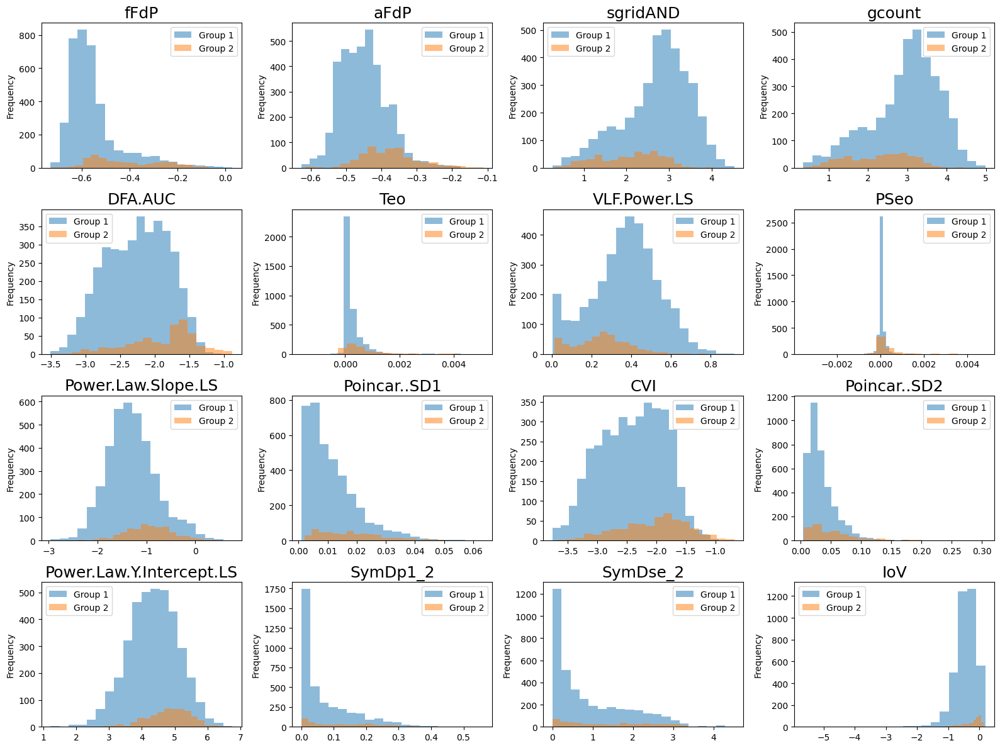

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

# The second column of the dataframe is the dependent binary variable -> Sepsis3
binary_dependent_variable = df.iloc[:, 1]

# Define two groups based on the binary dependent variable
group1 = df[binary_dependent_variable == 0]
group2 = df[binary_dependent_variable == 1]

# Calculate number of rows and columns for the subplot grid
num_features = len(all_features)
ncols = 4
nrows = int(num_features / ncols) if num_features % ncols == 0 else (num_features // ncols) + 1

# Create figure with subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 4, nrows * 3), sharex=False, sharey=False)
axes = axes.flatten()  # Flatten the 2D array of axes for easy iterating

# Plot histograms for all features
for i, feature in enumerate(all_features):
    ax = axes[i]
    if feature in df.columns:
        # Plot the histograms for the current feature
        ax.hist(group1[feature].dropna(), alpha=0.5, label='Group 1', bins=20)
        ax.hist(group2[feature].dropna(), alpha=0.5, label='Group 2', bins=20)
        #ax.hist(group1[feature].dropna(), alpha=0.5, label='Group 1 (Dependent variable = 0)', bins=20)
        #ax.hist(group2[feature].dropna(), alpha=0.5, label='Group 2 (Dependent variable = 1)', bins=20)
       # ax.set_xlabel(feature)
        ax.set_ylabel('Frequency')
        ax.set_title(feature,fontsize=18)
        ax.legend()


for i in range(num_features, nrows * ncols):
    axes[i].set_visible(False)

plt.tight_layout()  # Adjust subplot parameters for a clean layout
plt.savefig("Fig1-relative.png",format='png', dpi=300, bbox_inches='tight')

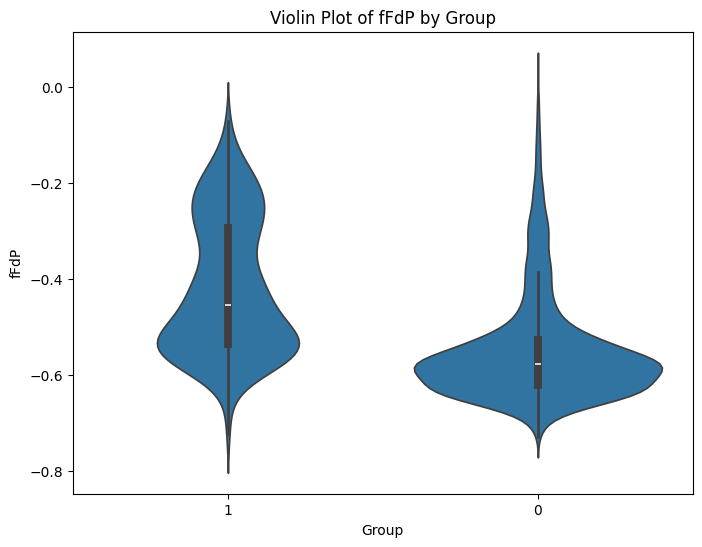

In [ ]:
import seaborn as sns


selected_feature = 'fFdP'

# Preparing DataFrame for Seaborn violin plot
df_violin = df[[selected_feature, 'Sepsis3']]
df_violin = df_violin.rename(columns={'Sepsis3': 'Group'})
df_violin['Group'] = df_violin['Group'].astype(str)  # Converting to string for categorical plotting

plt.figure(figsize=(8, 6))
sns.violinplot(x='Group', y=selected_feature, data=df_violin)
plt.title(f'Violin Plot of {selected_feature} by Group')
plt.savefig("violin_plot.png", format='png', dpi=300, bbox_inches='tight')

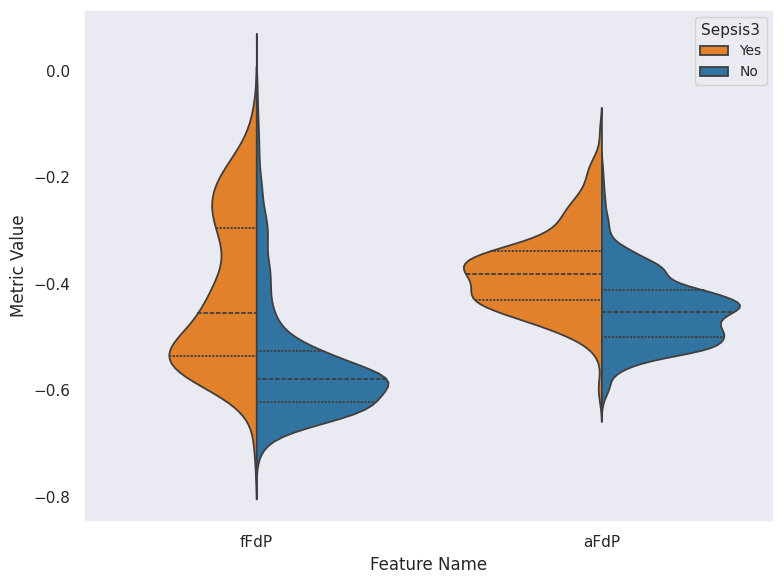

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


binary_dependent_variable_name = df.columns[1]
df['Sepsis3'] = df[binary_dependent_variable_name].replace({0: 'No', 1: 'Yes'})

selected_features = ['fFdP', 'aFdP']  # Example selected features


df['ID'] = df.index


mdf = pd.melt(df, id_vars=['ID', 'Sepsis3'], value_vars=selected_features, var_name='Feature', value_name='Value')


color_palette = {"Yes": "#ff7f0e", "No":"#1f77b4" }  # Blue and orange # Orange for 'Sepsis', Blue for 'Non-Sepsis'

plt.figure(figsize=(8, 6))  # Slightly adjusted figure size for aesthetic fit
ax = sns.violinplot(data=mdf, x='Feature', y='Value', hue='Sepsis3', split=True, inner="quart", linewidth=1.3, palette=color_palette)

# Customize plot elements
ax.set_ylabel('Metric Value', fontsize=12)
ax.set_xlabel('Feature Name', fontsize=12)
#ax.set_title("Feature Distributions by Sepsis3 Status", fontsize=14, pad=15)


ax.legend(title='Sepsis3', loc='upper right', fontsize=10, title_fontsize='11')

plt.tight_layout()
plt.savefig("fig2_combined_violin_plots.png", format='png', dpi=300, bbox_inches='tight')
plt.show()

# Feature Extraction 1 - Boruta Feature Selection

In [ ]:
import scipy as sp
def get_boruta_features(X, y, TRIALS=100, p=0.5):


    def get_important_features(X, y):
        rf = RandomForestClassifier(max_depth=20)
        rf.fit(X,y)
        importances = {feature_name: f_importance for feature_name, f_importance in zip(X.columns, rf.feature_importances_)}
        only_shadow_feat_importance = {key:value for key,value in importances.items() if "shadow" in key}
        highest_shadow_feature = list(dict(sorted(only_shadow_feat_importance.items(), key=lambda item: item[1], reverse=True)).values())[0]
        selected_features = [key for key, value in importances.items() if value > highest_shadow_feature]
        return selected_features

    def get_tail_items(pmf):
        total = 0
        for i, x in enumerate(pmf):
            total += x
            if total >= 0.05:
                break
        return i

    def choose_features(feature_hits, TRIALS, thresh):
        green_zone_thresh = TRIALS - thresh
        blue_zone_upper = green_zone_thresh
        blue_zone_lower = thresh
        green_zone = [key for key, value in feature_hits.items() if    value >= green_zone_thresh]
        blue_zone = [key for key, value in feature_hits.items() if (value >= blue_zone_lower and value < blue_zone_upper)]
        return green_zone,blue_zone


    X = X.copy()  # Create a copy of X to avoid SettingWithCopyWarning
    for col in X.columns:
        X[f"shadow_{col}"] = X[col].sample(frac=1).reset_index(drop=True)

    feature_hits = {i:0 for i in X.columns}
    for _ in range(TRIALS):
        imp_features = get_important_features(X, y)
        for key, _ in feature_hits.items():
            if key in imp_features: feature_hits[key] += 1

    print(feature_hits)

    pmf = [sp.stats.binom.pmf(x, TRIALS, p) for x in range(TRIALS + 1)]

    thresh = get_tail_items(pmf)
    green, blue = choose_features(feature_hits, TRIALS, thresh)
    return green + blue


In [ ]:
features_all = new_df.columns[1:]
print(features_all) #Including SI>1

Index(['SI>1', 'Mean.rate', 'Coefficient.of.variation', 'Poincar..SD1',
       'Poincar..SD2', 'LF.HF.ratio.LS', 'LF.Power.LS', 'HF.Power.LS',
       'DFA.Alpha.1', 'DFA.Alpha.2', 'Largest.Lyapunov.exponent',
       'Correlation.dimension', 'Power.Law.Slope.LS',
       'Power.Law.Y.Intercept.LS', 'DFA.AUC', 'Multiscale.Entropy',
       'VLF.Power.LS', 'Complexity', 'eScaleE', 'pR', 'pD', 'dlmax', 'sedl',
       'pDpR', 'pL', 'vlmax', 'sevl', 'shannEn', 'PSeo', 'Teo', 'SymDp0_2',
       'SymDp1_2', 'SymDp2_2', 'SymDfw_2', 'SymDse_2', 'SymDce_2', 'formF',
       'gcount', 'sgridAND', 'sgridTAU', 'sgridWGT', 'aFdP', 'fFdP', 'IoV',
       'KLPE', 'AsymI', 'CSI', 'CVI', 'ARerr', 'histSI', 'MultiFractal_c1',
       'MultiFractal_c2', 'SDLEalpha', 'SDLEmean', 'QSE', 'Hurst.exponent',
       'mean', 'median'],
      dtype='object')


In [ ]:
features_all = new_df.columns[1:]
X = new_df[features_all]
y = new_df['Sepsis3']
features_boruta_sepsis3 = get_boruta_features(X, y, p=0.5)
print(features_boruta_sepsis3)
len(features_boruta_sepsis3)

KeyboardInterrupt: 

# Feature Extraction 2 - XG Boost Feature Selection

In [ ]:
def select_features(X, y, threshold, model_type, test_size=0.2,random_state=0):

    X_Scaled, y = normalize_data(X, y, 'RobustScaler')

    # Split the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_Scaled, y, stratify=y, test_size=test_size, random_state=random_state)


    # Create a classifier
    if model_type == 'rf':
        clf = RandomForestClassifier(n_estimators=1000,
                                 random_state=0,
                                 n_jobs=-1,
                                 class_weight='balanced',
                                 min_samples_leaf=50,
                                 max_features='sqrt',
                                 max_depth=10)
    elif model_type == 'xgb':
        clf = XGBClassifier(
        learning_rate=0.01,
        n_estimators=1000,
        max_depth=4,
        min_child_weight=1,
        gamma=0.9,
        subsample=0.8,
        colsample_bytree=0.8,
        objective= 'binary:logistic',
        nthread=4,
        scale_pos_weight=1,
        seed=27,
        reg_alpha=0.01,
        reg_lambda=1,
        eval_metric='auc'
    ) # Use scale_pos_weight for imbalance data
    else:
        raise ValueError("Invalid model_type. Expected 'rf' or 'xgb'.")

    # Train the classifier
    clf.fit(X_train, y_train)

    # Create a selector object that will use the classifier to identify
    # features that have an importance of more than the threshold
    sfm = SelectFromModel(clf, threshold=threshold)

    # Train the selector
    sfm.fit(X_train, y_train)

    important_feature_indices = sfm.get_support(indices=True)

    # Get the names of the important features
    important_feature_names = [X.columns[i] for i in important_feature_indices]

    # Plot feature importances
    feature_importances = clf.feature_importances_
    sorted_idx = feature_importances.argsort() [::-1][:20]

    # Sort the feature importance names and scores
    sorted_importance_names = [X.columns[i] for i in sorted_idx]
    sorted_importance_scores = feature_importances[sorted_idx]

    # Plot using seaborn or matplotlib
    plt.figure(figsize=(7, 6))
    sns.barplot(x=sorted_importance_scores, y=sorted_importance_names, orient='h')
    sns.despine()
    plt.xlabel('Feature Importance Score')
    plt.ylabel('Feature Names')
    plt.savefig(model_type+'.png',bbox_inches='tight')

    return important_feature_names


['SI>1', 'Mean.rate', 'Coefficient.of.variation', 'Poincar..SD1', 'Poincar..SD2', 'LF.HF.ratio.LS', 'LF.Power.LS', 'HF.Power.LS', 'DFA.Alpha.1', 'Correlation.dimension', 'Power.Law.Slope.LS', 'Power.Law.Y.Intercept.LS', 'DFA.AUC', 'Multiscale.Entropy', 'VLF.Power.LS', 'Complexity', 'pR', 'pD', 'dlmax', 'sedl', 'pDpR', 'vlmax', 'shannEn', 'PSeo', 'Teo', 'SymDp0_2', 'SymDp1_2', 'SymDp2_2', 'SymDfw_2', 'SymDse_2', 'SymDce_2', 'formF', 'gcount', 'sgridAND', 'sgridTAU', 'sgridWGT', 'aFdP', 'fFdP', 'IoV', 'KLPE', 'AsymI', 'CSI', 'CVI', 'ARerr', 'histSI', 'MultiFractal_c1', 'MultiFractal_c2', 'SDLEalpha', 'SDLEmean', 'QSE', 'Hurst.exponent', 'mean', 'median']


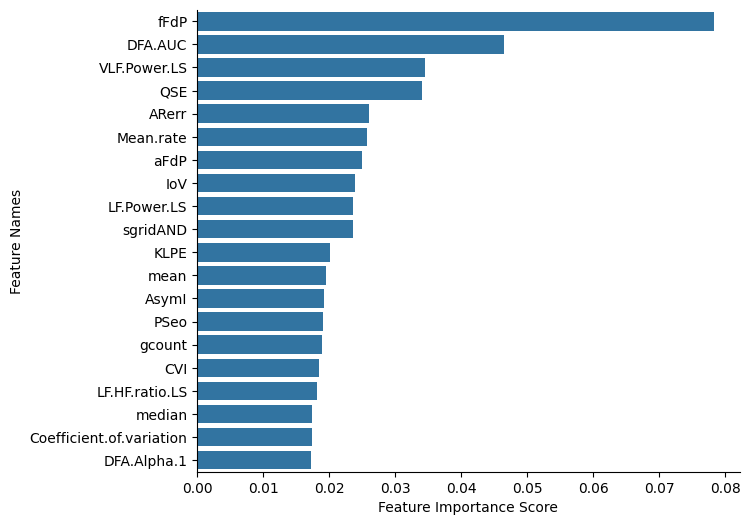

In [ ]:
features_all = new_df.columns[1:]
X = new_df[features_all]
y = new_df['Sepsis3']
features_xgboost_sepsis3 = select_features(X, y, 0.01, 'xgb')
print(features_xgboost_sepsis3)

# Feature Extraction 3 - Random Forest Feature Selection

['Mean.rate', 'Poincar..SD1', 'Poincar..SD2', 'LF.HF.ratio.LS', 'LF.Power.LS', 'HF.Power.LS', 'Power.Law.Slope.LS', 'Power.Law.Y.Intercept.LS', 'DFA.AUC', 'VLF.Power.LS', 'Complexity', 'shannEn', 'PSeo', 'Teo', 'gcount', 'sgridAND', 'aFdP', 'fFdP', 'IoV', 'KLPE', 'AsymI', 'CVI', 'ARerr', 'QSE', 'Hurst.exponent']


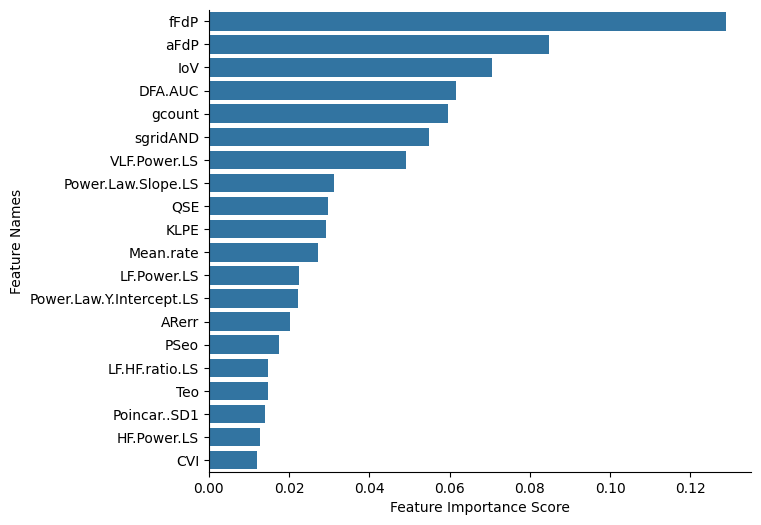

In [ ]:
features_all = new_df.columns[1:]
X = new_df[features_all]
y = new_df['Sepsis3']
features_random_forest_sepsis3 = select_features(X, y, 0.01, 'rf')
print(features_random_forest_sepsis3)

# All Features to be tested

In [ ]:
boruta_features_sepsis3= ['Mean.rate', 'Coefficient.of.variation', 'Poincar..SD1', 'Poincar..SD2', 'LF.HF.ratio.LS', 'LF.Power.LS', 'HF.Power.LS', 'DFA.Alpha.1', 'DFA.Alpha.2', 'Correlation.dimension', 'Power.Law.Slope.LS', 'Power.Law.Y.Intercept.LS', 'DFA.AUC', 'Multiscale.Entropy', 'VLF.Power.LS', 'Complexity', 'vlmax', 'shannEn', 'PSeo', 'Teo', 'SymDp2_2', 'gcount', 'sgridAND', 'sgridWGT', 'aFdP', 'fFdP', 'IoV', 'KLPE', 'AsymI', 'CSI', 'CVI', 'ARerr', 'MultiFractal_c1', 'MultiFractal_c2', 'SDLEalpha', 'SDLEmean', 'QSE', 'Hurst.exponent', 'mean', 'median','formF', 'sgridTAU']

In [ ]:
len(boruta_features_sepsis3)

42

In [ ]:
boruta_bootstrap_features_sepsis3=['Mean.rate', 'Coefficient.of.variation', 'Poincar..SD1', 'Poincar..SD2', 'LF.HF.ratio.LS', 'LF.Power.LS', 'HF.Power.LS', 'DFA.Alpha.1', 'Correlation.dimension', 'Power.Law.Slope.LS', 'Power.Law.Y.Intercept.LS', 'DFA.AUC','VLF.Power.LS', 'Complexity', 'vlmax', 'shannEn', 'PSeo', 'Teo', 'SymDp2_2', 'gcount', 'sgridAND', 'aFdP', 'fFdP', 'IoV', 'KLPE', 'AsymI', 'CSI', 'CVI', 'ARerr', 'MultiFractal_c1', 'MultiFractal_c2', 'SDLEalpha', 'SDLEmean', 'QSE', 'Hurst.exponent', 'mean', 'median', 'DFA.Alpha.2', 'formF', 'sgridTAU', 'sgridWGT']

In [ ]:
len(boruta_bootstrap_features_sepsis3)
# Removed Multiscale.Entropy it is not statistically significant in Bootstrapping

41

In [ ]:
bootstrap_features_sepsis3 = [
    'Mean.rate',
    'Coefficient.of.variation',
    'Poincar..SD1',
    'Poincar..SD2',
    'LF.HF.ratio.LS',
    'LF.Power.LS',
    'HF.Power.LS',
    'DFA.Alpha.1',
    'DFA.Alpha.2',
    'Largest.Lyapunov.exponent',
    'Correlation.dimension',
    'Power.Law.Slope.LS',
    'Power.Law.Y.Intercept.LS',
    'DFA.AUC',
    'VLF.Power.LS',
    'Complexity',
    'eScaleE',
    'pR',
    'dlmax',
    'sedl',
    'pDpR',
    'vlmax',
    'shannEn',
    'PSeo',
    'Teo',
    'SymDp0_2',
    'SymDp1_2',
    'SymDp2_2',
    'SymDfw_2',
    'SymDse_2',
    'SymDce_2',
    'formF',
    'gcount',
    'sgridAND',
    'sgridTAU',
    'sgridWGT',
    'aFdP',
    'fFdP',
    'IoV',
    'KLPE',
    'AsymI',
    'CSI',
    'CVI',
    'ARerr',
    'histSI',
    'MultiFractal_c1',
    'MultiFractal_c2',
    'SDLEalpha',
    'SDLEmean',
    'QSE',
    'Hurst.exponent',
    'mean',
    'median'
]

In [ ]:
xgboost_features_sepsis3=['SI>1', 'Mean.rate', 'Coefficient.of.variation', 'Poincar..SD1', 'Poincar..SD2', 'LF.HF.ratio.LS', 'LF.Power.LS', 'HF.Power.LS', 'DFA.Alpha.1', 'Correlation.dimension', 'Power.Law.Slope.LS', 'Power.Law.Y.Intercept.LS', 'DFA.AUC', 'Multiscale.Entropy', 'VLF.Power.LS', 'Complexity', 'pR', 'pD', 'dlmax', 'sedl', 'pDpR', 'vlmax', 'shannEn', 'PSeo', 'Teo', 'SymDp0_2', 'SymDp1_2', 'SymDp2_2', 'SymDfw_2', 'SymDse_2', 'SymDce_2', 'formF', 'gcount', 'sgridAND', 'sgridTAU', 'sgridWGT', 'aFdP', 'fFdP', 'IoV', 'KLPE', 'AsymI', 'CSI', 'CVI', 'ARerr', 'histSI', 'MultiFractal_c1', 'MultiFractal_c2', 'SDLEalpha', 'SDLEmean', 'QSE', 'Hurst.exponent', 'mean', 'median']

In [ ]:
randomforest_features_sepsis3=['Mean.rate', 'Poincar..SD1', 'Poincar..SD2', 'LF.HF.ratio.LS', 'LF.Power.LS', 'HF.Power.LS', 'Power.Law.Slope.LS', 'Power.Law.Y.Intercept.LS', 'DFA.AUC', 'VLF.Power.LS', 'Complexity', 'shannEn', 'PSeo', 'Teo', 'gcount', 'sgridAND', 'aFdP', 'fFdP', 'IoV', 'KLPE', 'AsymI', 'CVI', 'ARerr', 'QSE', 'Hurst.exponent']

In [ ]:
# Define the feature lists
feature_lists = {
     'boruta_features_sepsis3': boruta_features_sepsis3,
     'boruta_bootstrap_features_sepsis3':boruta_bootstrap_features_sepsis3,
     'bootstrap_features_sepsis3':bootstrap_features_sepsis3,
     'xgboost_features_sepsis3':xgboost_features_sepsis3,
     'randomforest_features_sepsis3':randomforest_features_sepsis3
}



# Model Calls

In [ ]:
# Declare a global dataframe
global df_results
df_results = pd.DataFrame(columns=['State','Predict', 'Model', 'Accuracy', 'F1 Score', 'Precision', 'Recall','Beta'])

In [ ]:
def preprocess_data (df, target_column, feature_names):
    X = df[feature_names].values
    y = df[target_column].values

    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20, stratify=y, random_state=0)

    # Standardize the features
    means = np.mean(X_train, axis=0)
    stds = np.std(X_train, axis=0)

    X_train = (X_train - means) / stds
    X_val = (X_val - means) / stds

    return X_train, y_train, X_val, y_val

In [ ]:
#adding epsilon to avoid divide by zero error
def find_optimal_threshold(precision, recall, thresholds, beta=2):
    epsilon = 1e-7  # small constant
    f_score = (1 + beta**2) * (precision * recall) / ((beta**2 * precision) + recall + epsilon)
    index = np.argmax(f_score)
    return thresholds[index]

In [ ]:
def train_models_threshold(state, predict, X_train, y_train, X_test, y_test, beta=2):
    global df_results

    # Define the models
    xgb = XGBClassifier(
              learning_rate=0.01,
              n_estimators=1000,
              max_depth=4,
              gamma=0.9,
              subsample=0.8,
              colsample_bytree=0.8,
              objective= 'binary:logistic',
              nthread=4,
              scale_pos_weight=1,
              seed=27,
              reg_alpha=0.01,
              reg_lambda=1,
              eval_metric='auc')

    rf = RandomForestClassifier(n_estimators=1000,
                             n_jobs=-1,
                             class_weight='balanced',
                             min_samples_leaf=50,
                             max_features='sqrt',
                             max_depth=10)

    # Train the models
    xgb.fit(X_train, y_train)
    rf.fit(X_train, y_train)

    # Make predictions
    xgb_preds = xgb.predict(X_test)
    rf_preds = rf.predict(X_test)

     # Make predictions on training data
    xgb_train_preds = xgb.predict(X_train)
    rf_train_preds = rf.predict(X_train)

    # Predict probabilities
    xgb_probs = xgb.predict_proba(X_test)[:, 1]
    rf_probs = rf.predict_proba(X_test)[:, 1]

    # Get precision and recall values for different thresholds
    xgb_precision, xgb_recall, xgb_thresholds = precision_recall_curve(y_test, xgb_probs)
    rf_precision, rf_recall, rf_thresholds = precision_recall_curve(y_test, rf_probs)


    # Find optimal thresholds
    xgb_threshold = find_optimal_threshold(xgb_precision, xgb_recall, xgb_thresholds,beta=beta)
    rf_threshold = find_optimal_threshold(rf_precision, rf_recall, rf_thresholds,beta=beta)

    # Adjust predictions based on the new thresholds
    xgb_preds = [1 if prob > xgb_threshold else 0 for prob in xgb_probs]
    rf_preds = [1 if prob > rf_threshold else 0 for prob in rf_probs]

    # Print performance on Testing Data with Thresholds
    print("XGBoost Performance on Testing Data with Thresholds:")
    print("Accuracy: ", accuracy_score(y_test, xgb_preds))
    print("F1 Score: ", f1_score(y_test, xgb_preds))
    print("Precision: ", precision_score(y_test, xgb_preds,zero_division=1))
    print("Recall: ", recall_score(y_test, xgb_preds,zero_division=1))
    print("Confusion Matrix: ")
    plt.figure(figsize=(2, 2))
    sns.heatmap(confusion_matrix(y_test, xgb_preds), annot=True, fmt='d',cmap='Blues')
    plt.show()
    df_results = pd.concat([df_results, pd.DataFrame([{
        'State': state,
        'Predict':predict,
        'Model': 'XGBoost',
        'Accuracy': accuracy_score(y_test, xgb_preds),
        'F1 Score': f1_score(y_test, xgb_preds),
        'Precision': precision_score(y_test, xgb_preds,zero_division=1),
        'Recall': recall_score(y_test, xgb_preds,zero_division=1),
        'Beta':beta
    }], index=[0])], ignore_index=True)

    print("Random Forest Performance on Testing Data with Thresholds:")
    print("Accuracy: ", accuracy_score(y_test, rf_preds))
    print("F1 Score: ", f1_score(y_test, rf_preds))
    print("Precision: ", precision_score(y_test, rf_preds,zero_division=1))
    print("Recall: ", recall_score(y_test, rf_preds,zero_division=1))
    print("Confusion Matrix: ")
    plt.figure(figsize=(2, 2))
    sns.heatmap(confusion_matrix(y_test, rf_preds), annot=True, fmt='d',cmap='Blues')
    plt.show()
    df_results = pd.concat([df_results, pd.DataFrame([{
        'State': state,
        'Predict':predict,
        'Model': 'Random Forest',
        'Accuracy': accuracy_score(y_test, rf_preds),
        'F1 Score': f1_score(y_test, rf_preds),
        'Precision': precision_score(y_test, rf_preds,zero_division=1),
        'Recall': recall_score(y_test, rf_preds,zero_division=1),
        'Beta':beta
    }], index=[0])], ignore_index=True)

    return xgb, rf, xgb_threshold, rf_threshold

In [ ]:

def run_experiments(df, target_column, feature_lists, betas):
    results = []
    for feature_list_name, feature_list in feature_lists.items():
        for beta in betas:
            # Preprocess the data
            X_train, y_train, X_val, y_val = preprocess_data(df, target_column, feature_list)

            # Train the models and get thresholds
            xgb, rf, xgb_threshold, rf_threshold = train_models_threshold(
                feature_list_name, target_column, X_train, y_train, X_val, y_val, beta=beta
            )

            # Collect results
            results.append({
                'FeatureList': feature_list_name,
                'Beta': beta,
                'XGB_Threshold': xgb_threshold,
                'RF_Threshold': rf_threshold,
                'Results_DF': df_results
            })

    return results



# Run Experiments

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.936268829663963
F1 Score:  0.6745562130177515
Precision:  0.9344262295081968
Recall:  0.5277777777777778
Confusion Matrix: 


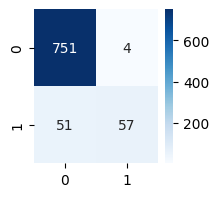

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.9154113557358053
F1 Score:  0.5875706214689266
Precision:  0.7536231884057971
Recall:  0.48148148148148145
Confusion Matrix: 


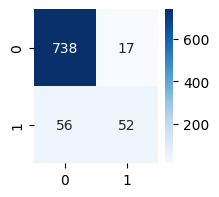

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.936268829663963
F1 Score:  0.7317073170731706
Precision:  0.7731958762886598
Recall:  0.6944444444444444
Confusion Matrix: 


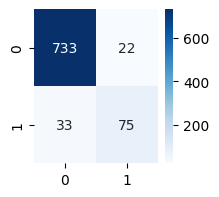

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.8968713789107764
F1 Score:  0.6307053941908713
Precision:  0.5714285714285714
Recall:  0.7037037037037037
Confusion Matrix: 


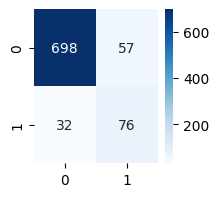

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9154113557358053
F1 Score:  0.7091633466135459
Precision:  0.6223776223776224
Recall:  0.8240740740740741
Confusion Matrix: 


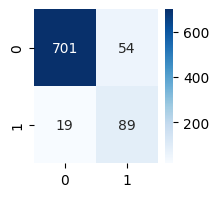

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.8818076477404403
F1 Score:  0.6106870229007634
Precision:  0.5194805194805194
Recall:  0.7407407407407407
Confusion Matrix: 


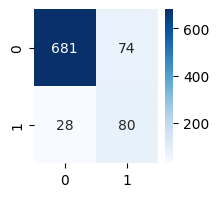

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9316338354577057
F1 Score:  0.628930817610063
Precision:  0.9803921568627451
Recall:  0.46296296296296297
Confusion Matrix: 


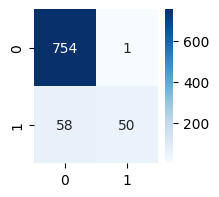

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.9142526071842411
F1 Score:  0.5842696629213483
Precision:  0.7428571428571429
Recall:  0.48148148148148145
Confusion Matrix: 


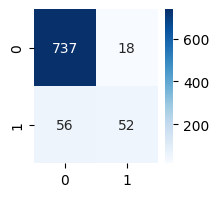

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9339513325608343
F1 Score:  0.742081447963801
Precision:  0.7256637168141593
Recall:  0.7592592592592593
Confusion Matrix: 


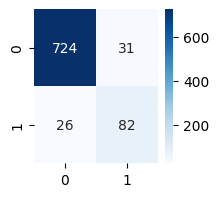

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.8980301274623407
F1 Score:  0.6302521008403361
Precision:  0.5769230769230769
Recall:  0.6944444444444444
Confusion Matrix: 


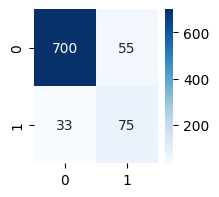

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9026651216685979
F1 Score:  0.6888888888888889
Precision:  0.5740740740740741
Recall:  0.8611111111111112
Confusion Matrix: 


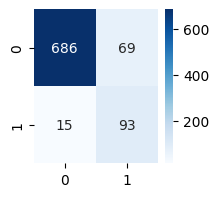

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.8818076477404403
F1 Score:  0.6106870229007634
Precision:  0.5194805194805194
Recall:  0.7407407407407407
Confusion Matrix: 


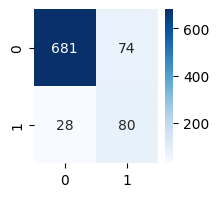

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9281575898030128
F1 Score:  0.5974025974025974
Precision:  1.0
Recall:  0.42592592592592593
Confusion Matrix: 


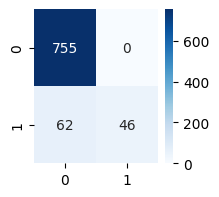

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.9154113557358053
F1 Score:  0.582857142857143
Precision:  0.7611940298507462
Recall:  0.4722222222222222
Confusion Matrix: 


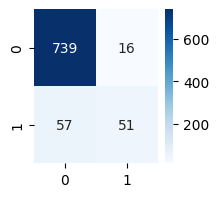

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9374275782155272
F1 Score:  0.7452830188679245
Precision:  0.7596153846153846
Recall:  0.7314814814814815
Confusion Matrix: 


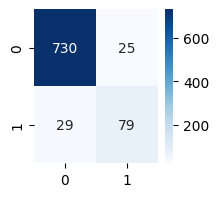

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.9107763615295481
F1 Score:  0.631578947368421
Precision:  0.6534653465346535
Recall:  0.6111111111111112
Confusion Matrix: 


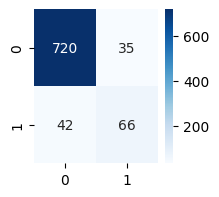

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.8980301274623407
F1 Score:  0.6788321167883212
Precision:  0.5602409638554217
Recall:  0.8611111111111112
Confusion Matrix: 


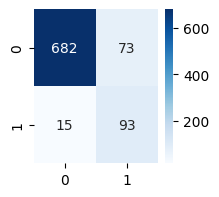

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.7717265353418308
F1 Score:  0.49872773536895676
Precision:  0.34385964912280703
Recall:  0.9074074074074074
Confusion Matrix: 


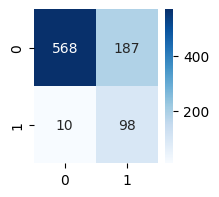

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.93279258400927
F1 Score:  0.6506024096385543
Precision:  0.9310344827586207
Recall:  0.5
Confusion Matrix: 


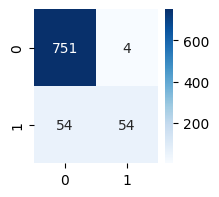

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.9142526071842411
F1 Score:  0.6185567010309277
Precision:  0.6976744186046512
Recall:  0.5555555555555556
Confusion Matrix: 


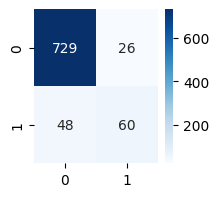

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9385863267670915
F1 Score:  0.7309644670050761
Precision:  0.8089887640449438
Recall:  0.6666666666666666
Confusion Matrix: 


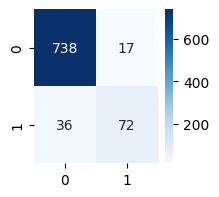

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.9038238702201622
F1 Score:  0.6278026905829597
Precision:  0.6086956521739131
Recall:  0.6481481481481481
Confusion Matrix: 


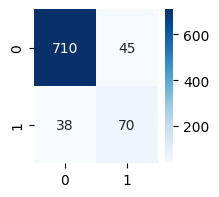

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9235225955967555
F1 Score:  0.7250000000000001
Precision:  0.6590909090909091
Recall:  0.8055555555555556
Confusion Matrix: 


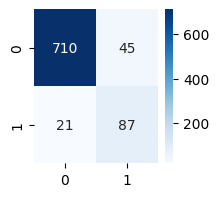

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.7740440324449595
F1 Score:  0.5012787723785166
Precision:  0.3462897526501767
Recall:  0.9074074074074074
Confusion Matrix: 


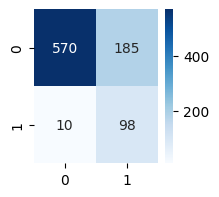

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9316338354577057
F1 Score:  0.6740331491712708
Precision:  0.8356164383561644
Recall:  0.5648148148148148
Confusion Matrix: 


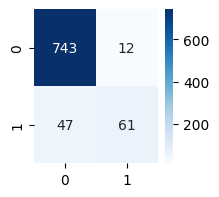

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.9119351100811124
F1 Score:  0.5529411764705883
Precision:  0.7580645161290323
Recall:  0.4351851851851852
Confusion Matrix: 


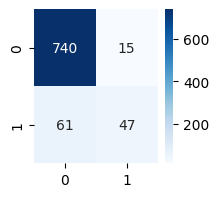

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9281575898030128
F1 Score:  0.7256637168141593
Precision:  0.6949152542372882
Recall:  0.7592592592592593
Confusion Matrix: 


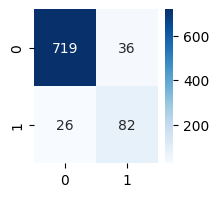

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.9073001158748552
F1 Score:  0.6190476190476191
Precision:  0.6372549019607843
Recall:  0.6018518518518519
Confusion Matrix: 


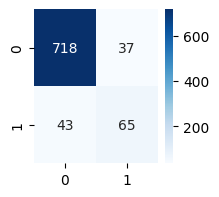

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9084588644264194
F1 Score:  0.6926070038910506
Precision:  0.5973154362416108
Recall:  0.8240740740740741
Confusion Matrix: 


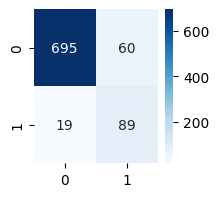

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.8018539976825029
F1 Score:  0.5183098591549297
Precision:  0.3724696356275304
Recall:  0.8518518518518519
Confusion Matrix: 


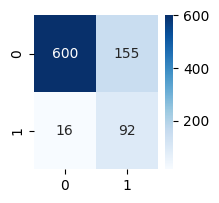

In [ ]:
# Define the betas  to test
betas = [0.5, 1, 2]

# Run experiments with all feature lists and betas
results=experiment_results = run_experiments(new_df, 'Sepsis3', feature_lists, betas)



In [ ]:
#print(results)

# Results

In [ ]:
#Compare F1 score
df_results[(df_results['Predict'] == 'Sepsis3') & (df_results['Beta'] == 1.0)].sort_values(by='F1 Score', ascending=False)

,State,Predict,Model,Accuracy,F1 Score,Precision,Recall,Beta
14,bootstrap_features_sepsis3,Sepsis3,XGBoost,0.937428,0.745283,0.759615,0.731481,1.0
8,boruta_bootstrap_features_sepsis3,Sepsis3,XGBoost,0.933951,0.742081,0.725664,0.759259,1.0
2,boruta_features_sepsis3,Sepsis3,XGBoost,0.936269,0.731707,0.773196,0.694444,1.0
20,xgboost_features_sepsis3,Sepsis3,XGBoost,0.938586,0.730964,0.808989,0.666667,1.0
26,randomforest_features_sepsis3,Sepsis3,XGBoost,0.928158,0.725664,0.694915,0.759259,1.0
15,bootstrap_features_sepsis3,Sepsis3,Random Forest,0.910776,0.631579,0.653465,0.611111,1.0
3,boruta_features_sepsis3,Sepsis3,Random Forest,0.896871,0.630705,0.571429,0.703704,1.0
9,boruta_bootstrap_features_sepsis3,Sepsis3,Random Forest,0.898030,0.630252,0.576923,0.694444,1.0
21,xgboost_features_sepsis3,Sepsis3,Random Forest,0.903824,0.627803,0.608696,0.648148,1.0
27,randomforest_features_sepsis3,Sepsis3,Random Forest,0.907300,0.619048,0.637255,0.601852,1.0


In [ ]:
#Compare Precisions
df_results[(df_results['Predict'] == 'Sepsis3')& (df_results['Beta'] == 0.5)].sort_values(by='Precision', ascending=False)

,State,Predict,Model,Accuracy,F1 Score,Precision,Recall,Beta
12,bootstrap_features_sepsis3,Sepsis3,XGBoost,0.928158,0.597403,1.000000,0.425926,0.5
6,boruta_bootstrap_features_sepsis3,Sepsis3,XGBoost,0.931634,0.628931,0.980392,0.462963,0.5
0,boruta_features_sepsis3,Sepsis3,XGBoost,0.936269,0.674556,0.934426,0.527778,0.5
18,xgboost_features_sepsis3,Sepsis3,XGBoost,0.932793,0.650602,0.931034,0.500000,0.5
24,randomforest_features_sepsis3,Sepsis3,XGBoost,0.931634,0.674033,0.835616,0.564815,0.5
13,bootstrap_features_sepsis3,Sepsis3,Random Forest,0.915411,0.582857,0.761194,0.472222,0.5
25,randomforest_features_sepsis3,Sepsis3,Random Forest,0.911935,0.552941,0.758065,0.435185,0.5
1,boruta_features_sepsis3,Sepsis3,Random Forest,0.915411,0.587571,0.753623,0.481481,0.5
7,boruta_bootstrap_features_sepsis3,Sepsis3,Random Forest,0.914253,0.584270,0.742857,0.481481,0.5
19,xgboost_features_sepsis3,Sepsis3,Random Forest,0.914253,0.618557,0.697674,0.555556,0.5


In [ ]:
#Compare Precisions
df_results[(df_results['Predict'] == 'Sepsis3')& (df_results['Beta'] == 2.0)].sort_values(by='Recall', ascending=False)

,State,Predict,Model,Accuracy,F1 Score,Precision,Recall,Beta
17,bootstrap_features_sepsis3,Sepsis3,Random Forest,0.771727,0.498728,0.343860,0.907407,2.0
23,xgboost_features_sepsis3,Sepsis3,Random Forest,0.774044,0.501279,0.346290,0.907407,2.0
10,boruta_bootstrap_features_sepsis3,Sepsis3,XGBoost,0.902665,0.688889,0.574074,0.861111,2.0
16,bootstrap_features_sepsis3,Sepsis3,XGBoost,0.898030,0.678832,0.560241,0.861111,2.0
29,randomforest_features_sepsis3,Sepsis3,Random Forest,0.801854,0.518310,0.372470,0.851852,2.0
4,boruta_features_sepsis3,Sepsis3,XGBoost,0.915411,0.709163,0.622378,0.824074,2.0
28,randomforest_features_sepsis3,Sepsis3,XGBoost,0.908459,0.692607,0.597315,0.824074,2.0
22,xgboost_features_sepsis3,Sepsis3,XGBoost,0.923523,0.725000,0.659091,0.805556,2.0
5,boruta_features_sepsis3,Sepsis3,Random Forest,0.881808,0.610687,0.519481,0.740741,2.0
11,boruta_bootstrap_features_sepsis3,Sepsis3,Random Forest,0.881808,0.610687,0.519481,0.740741,2.0


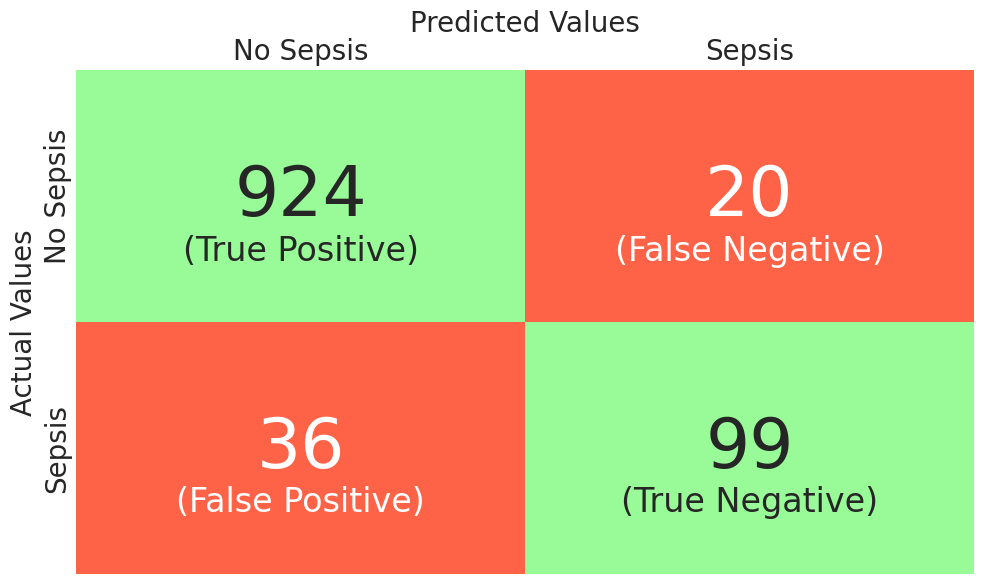

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

sns.set(style='white')
cm = np.array([[924,20],[ 36,99]])
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(np.eye(2), annot=cm, fmt='g', annot_kws={'size': 50},
            cmap=sns.color_palette(['tomato', 'palegreen'], as_cmap=True), cbar=False,
            yticklabels=['No Sepsis', 'Sepsis'], xticklabels=['No Sepsis', 'Sepsis'], ax=ax)
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.tick_params(labelsize=20, length=0)

#ax.set_title('Seaborn Confusion Matrix with labels', size=24, pad=20)
ax.set_xlabel('Predicted Values', size=20)
ax.set_ylabel('Actual Values', size=20)

additional_texts = ['(True Positive)', '(False Negative)', '(False Positive)', '(True Negative)']
for text_elt, additional_text in zip(ax.texts, additional_texts):
    ax.text(*text_elt.get_position(), '\n' + additional_text, color=text_elt.get_color(),
            ha='center', va='top', size=24)

plt.tight_layout()

# Save the figure before displaying it
plt.savefig("confusion_matrix.png", dpi=300)

# Then display it
plt.show()

# Ensembling High Precision and High Recall Model

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9026651216685979
F1 Score:  0.6888888888888889
Precision:  0.5740740740740741
Recall:  0.8611111111111112
Confusion Matrix: 


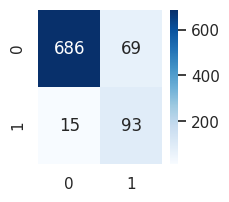

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.7867902665121669
F1 Score:  0.5106382978723404
Precision:  0.3582089552238806
Recall:  0.8888888888888888
Confusion Matrix: 


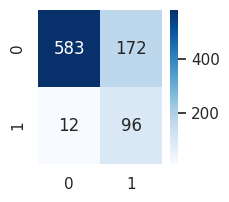

In [ ]:
#High Recall Model

X_train, y_train, X_val, y_val = preprocess_data (new_df, 'Sepsis3', boruta_bootstrap_features_sepsis3)
xgb_boruta_sep_recall, rf_borutasep_recall, xgb_threshold_sep_recall, rf_threshold_sep_recall =train_models_threshold('Boruta_Boot_Sepsis3', 'Sepsis3', X_train, y_train, X_val, y_val, beta=2.0)

In [ ]:
print(X_val.shape)

(863, 41)


In [ ]:
print(rf_threshold_sep_recall)

0.40287431305313914


In [ ]:
pred_v = rf_borutasep_recall.predict_proba(X_val)[:, 1]
pred_v = pred_v >= rf_threshold_sep_recall

In [ ]:
recall_score(y_val, pred_v)

0.8981481481481481

In [ ]:
# Add the recall prediction probability from Random Forest - Normalize the entire feature matrix

ensemble_sep_df=pd.DataFrame()

X_combined = np.concatenate((X_train, X_val), axis=0)
Y_combined = np.concatenate((y_train, y_val), axis=0)

X_sepsis_recall = rf_borutasep_recall.predict_proba(X_combined)[:,1]

ensemble_sep_df['pred_proba_recall']=X_sepsis_recall.flatten()
ensemble_sep_df['Actual_Value']=Y_combined


print(ensemble_sep_df.head())

   pred_proba_recall  Actual_Value
0           0.103552             0
1           0.683471             0
2           0.049077             0
3           0.038880             0
4           0.675626             0


XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9281575898030128
F1 Score:  0.5974025974025974
Precision:  1.0
Recall:  0.42592592592592593
Confusion Matrix: 


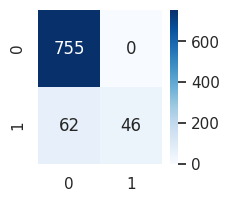

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.9130938586326767
F1 Score:  0.5945945945945946
Precision:  0.7142857142857143
Recall:  0.5092592592592593
Confusion Matrix: 


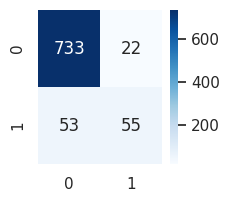

In [ ]:
#High Precision Model
X_train, y_train, X_val, y_val = preprocess_data (new_df, 'Sepsis3', bootstrap_features_sepsis3)
xgb_boruta_sep_precision, rf_boruta2_sep_precision, xgb_threshold2_sep_precision, rf_threshold2_sep_precision=train_models_threshold('Boot_Sepsis3', 'Sepsis3', X_train, y_train, X_val, y_val, beta=0.5)


In [ ]:
print(xgb_threshold2_sep_precision)

0.7219836


In [ ]:
pred_v2 = xgb_boruta_sep_precision.predict_proba(X_val)[:,1]
pred_v2 = pred_v2 >= xgb_threshold2_sep_precision

In [ ]:
precision_score(y_v, pred_v2)

1.0

In [ ]:
X_combined = np.concatenate((X_train, X_val), axis=0)
X_boruta_proba_precision = xgb_boruta_sep_precision.predict_proba(X_combined)[:,1]
ensemble_sep_df['pred_proba_precision']=X_boruta_proba_precision.flatten()

print(ensemble_sep_df.head())

   pred_proba_recall  Actual_Value  pred_proba_precision
0           0.103552             0              0.005168
1           0.683471             0              0.194626
2           0.049077             0              0.002159
3           0.038880             0              0.002436
4           0.675626             0              0.127372


In [ ]:
ensemble_sep_df.shape

(4314, 3)

In [ ]:
precision_threshold = xgb_threshold2_sep_precision
recall_threshold=rf_threshold_sep_recall

In [ ]:
# Format prediction probability  (e.g., 6 decimal places)
ensemble_sep_df['pred_proba_recall'] = ensemble_sep_df['pred_proba_recall'].map('{:.6f}'.format).astype(float)
ensemble_sep_df['pred_proba_precision'] = ensemble_sep_df['pred_proba_precision'].map('{:.6f}'.format).astype(float)

#reordering columns
ensemble_sep_df = ensemble_sep_df[['pred_proba_recall', 'pred_proba_precision', 'Actual_Value']]


print(ensemble_sep_df.head())

   pred_proba_recall  pred_proba_precision  Actual_Value
0           0.103552              0.005168             0
1           0.683471              0.194626             0
2           0.049077              0.002159             0
3           0.038880              0.002436             0
4           0.675626              0.127372             0


In [ ]:
print(ensemble_sep_df["Actual_Value"].value_counts())

0    3776
1     538
Name: Actual_Value, dtype: int64


In [ ]:
ensemble_df = ensemble_sep_df[['pred_proba_recall', 'pred_proba_precision', 'Actual_Value']]

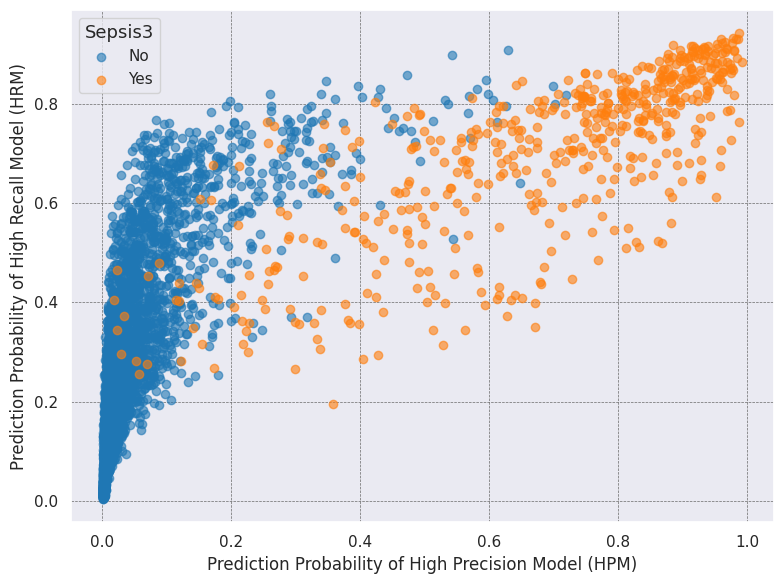

In [ ]:
import matplotlib.pyplot as plt



# Creating the plot
plt.figure(figsize=(8, 6))
# Scatter plot for label 0
mask = ensemble_df['Actual_Value'] == 0
plt.scatter(ensemble_df.loc[mask, 'pred_proba_precision'], ensemble_df.loc[mask, 'pred_proba_recall'],
            color='#1f77b4', alpha=0.6, label='No')
# Scatter plot for label 1
mask = ensemble_df['Actual_Value'] == 1
plt.scatter(ensemble_df.loc[mask, 'pred_proba_precision'], ensemble_df.loc[mask, 'pred_proba_recall'],
            color='#ff7f0e', alpha=0.6, label='Yes')

# Labeling axes
plt.xlabel('Prediction Probability of High Precision Model (HPM)', fontsize=12)
plt.ylabel('Prediction Probability of High Recall Model (HRM)', fontsize=12)
# Remove colorbar, instead use legend
plt.legend(title='Sepsis3', title_fontsize='13', fontsize='11')

plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='dimgray')

plt.tight_layout()
plt.savefig('Fig5-2d_plot.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
from sklearn.linear_model import LogisticRegression

X = ensemble_df[['pred_proba_recall', 'pred_proba_precision']].values
y = ensemble_df['Actual_Value'].values

# Split the dataset into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

X_train = X[:3451,:]
y_train = y[:3451]
X_test = X[3451:,:]
y_test = y[3451:]

# Standardize the input features.
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# Initialize and train a logistic regression model.
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

# Make predictions on the test set.
y_pred = logreg.predict(X_test)

# Calculate precision and recall for the test set.
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1_score = f1_score(y_test, y_pred)

print(f'Precision: {precision:.4f}, Recall: {recall:.4f}, F1 score: {f1_score:.4f}')

Precision: 0.7912, Recall: 0.6667, F1 score: 0.7236


In [ ]:
from sklearn.svm import SVC  # Support Vector Classifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, recall_score, f1_score

# Split the dataset into training and testing sets.
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

X_train = X[:3451,:]
y_train = y[:3451]
X_test = X[3451:,:]
y_test = y[3451:]


# Standardize the input features.
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train an SVM model.
svm_model = SVC(
    C=1.0,
    kernel='rbf',
    degree=4,
    gamma='scale',
    probability=True,
    class_weight='balanced',
    max_iter=-1,
    random_state=0
)

svm_model.fit(X_train_scaled, y_train)

svm_model.fit(X_train_scaled, y_train)

# Make predictions on the test set.
y_pred = svm_model.predict(X_test_scaled)

# Calculate precision and recall for the test set.
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1_score = f1_score(y_test, y_pred)

print(f'Precision: {precision:.4f}, Recall: {recall:.4f}, F1 score: {f1_score:.4f}')

Precision: 0.6917, Recall: 0.7685, F1 score: 0.7281


In [ ]:
#Manual Check of Ensemble mode

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


# Define a function to create compound predictions based on the rules
def get_compound_prediction(row):
    if row['pred_binary_recall'] == 1 and row['pred_binary_precision'] ==1 and row['Actual_Value']== 1:
        return 1  # Both models predict 1
    elif row['pred_binary_recall'] == 0 and row['pred_binary_precision'] == 0 and row['Actual_Value']== 0:
        return 0  # Both models predict 0
    if row['pred_binary_recall'] == 1 and row['pred_binary_precision'] ==1 and row['Actual_Value']== 0:
        return 2  # Precision is affected
    if row['pred_binary_recall'] == 0 and row['pred_binary_precision'] ==0 and row['Actual_Value']== 1:
        return 3  # Recall is affected
    else:
        return -1  # Models disagree

# Create a new column for compound predictions
ensemble_sep_df['compound_prediction'] = ensemble_sep_df.apply(get_compound_prediction, axis=1)



KeyError: 'pred_binary_recall'

In [ ]:
ensemble_sep_df.shape

In [ ]:
print(ensemble_sep_df["compound_prediction"].value_counts())

In [ ]:
ensemble_sep_df_test=ensemble_sep_df[3451:]

In [ ]:
ensemble_sep_df_test.shape

In [ ]:
print(ensemble_sep_df_test["compound_prediction"].value_counts())

# Explanability with the Model having high F1 score

XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9323447636700649
F1 Score:  0.7326007326007326
Precision:  0.7246376811594203
Recall:  0.7407407407407407
Confusion Matrix: 


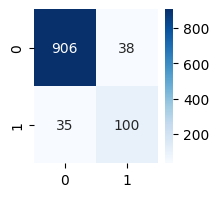

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.8943466172381835
F1 Score:  0.6199999999999999
Precision:  0.5636363636363636
Recall:  0.6888888888888889
Confusion Matrix: 


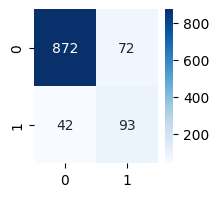

In [ ]:
# Trying a split ratio of 75/25
from sklearn.metrics import f1_score
#Random Forest Model High in F1score
X_train, y_train, X_val, y_val = preprocess_data (new_df, 'Sepsis3', bootstrap_features_sepsis3)
xgb_boruta_sep_precision, rf_boruta2_sep_precision, xgb_threshold2_sep_precision, rf_threshold2_sep_precision=train_models_threshold('Boot_Sepsis3', 'Sepsis3', X_train, y_train, X_val, y_val, beta=1.0)


XGBoost Performance on Testing Data with Thresholds:
Accuracy:  0.9374275782155272
F1 Score:  0.7452830188679245
Precision:  0.7596153846153846
Recall:  0.7314814814814815
Confusion Matrix: 


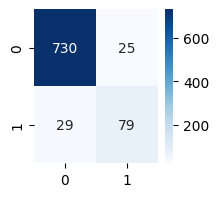

Random Forest Performance on Testing Data with Thresholds:
Accuracy:  0.9026651216685979
F1 Score:  0.6283185840707964
Precision:  0.6016949152542372
Recall:  0.6574074074074074
Confusion Matrix: 


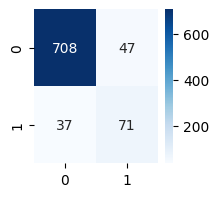

In [ ]:
# A split ratio of 80/20 is better for higher model outcome metrics.
from sklearn.metrics import f1_score
#Random Forest Model High in F1score
X_train, y_train, X_val, y_val = preprocess_data (new_df, 'Sepsis3', bootstrap_features_sepsis3)
xgb_boruta_sep_precision, rf_boruta2_sep_precision, xgb_threshold2_sep_precision, rf_threshold2_sep_precision=train_models_threshold('Boot_Sepsis3', 'Sepsis3', X_train, y_train, X_val, y_val, beta=1.0)


In [ ]:
print(xgb_threshold2_sep_precision)

0.33731195


In [ ]:
pred_v2 = xgb_boruta_sep_precision.predict_proba(X_val)[:,1]
pred_v2 = pred_v2 >= xgb_threshold2_sep_precision

In [ ]:
f1_score(y_v, pred_v2)

0.7511737089201878

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=e31c921c2c9302f6e6ca3dff73d22c4b5ac53a60020f345dea35e1c0fc6ee694
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import matplotlib.pyplot as plt

def explain_model_with_lime(X_train, X_test, model, feature_names, num_instances=5):
    explainer = lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=feature_names,
        class_names=['0', '1'],
        verbose=True,
        mode='classification'
    )

    # Increase the figure size if there are many features
    plt.figure(figsize=(12, 8))  # Adjust the size accordingly

    # Explain multiple instances
    for idx_to_explain in range(num_instances):
        print(f"Explaining instance {idx_to_explain+1}/{num_instances}")
        lime_exp = explainer.explain_instance(X_test[idx_to_explain], model.predict_proba, num_features=25)

        # Show the explanation
        lime_exp.show_in_notebook(show_table=True, show_all=False)
        # print the explanation:
        print(lime_exp.as_list())

        # Generate and edit the plot
        fig = lime_exp.as_pyplot_figure()
        plt.xticks(rotation=45)  # Adjust rotation angle to make text readable, 45 or 90 degrees might be good choices
        plt.tight_layout()  # Advanced layouts adjustments

        plt.show()




Explaining instance 1/5
Intercept 0.07750209282030575
Prediction_local [0.10049617]
Right: 0.2099833


[('fFdP > 0.24', 0.08001441875815109), ('SDLEalpha > 0.38', -0.03661804872776486), ('Mean.rate > 0.74', -0.026701782305871412), ('IoV > 0.70', 0.022637979023144957), ('-0.58 < pR <= -0.34', -0.01598300561850304), ('-0.73 < aFdP <= -0.06', -0.01431878199615848), ('-0.25 < KLPE <= 0.51', -0.013824682070970975), ('-0.37 < mean <= 0.04', -0.013157246472324498), ('DFA.AUC <= -0.78', 0.011400320748982576), ('-0.64 < sgridAND <= 0.16', 0.011368645329041822), ('vlmax <= -0.56', -0.008329431641416337), ('-0.60 < AsymI <= -0.02', 0.008219651248505164), ('-0.34 < median <= 0.10', -0.008166726357662187), ('HF.Power.LS > 0.39', -0.00811853008421129), ('-0.75 < QSE <= -0.02', 0.00788332772427593), ('PSeo <= -0.29', 0.006986764979591202), ('Coefficient.of.variation <= -0.69', 0.0066478995011181345), ('-0.65 < VLF.Power.LS <= 0.06', 0.006354894467448183), ('LF.Power.LS > 0.53', 0.0061644924059774805), ('-0.59 < LF.HF.ratio.LS <= -0.31', -0.005918734720694688), ('0.17 < gcount <= 0.71', 0.0054780882438

<Figure size 1200x800 with 0 Axes>

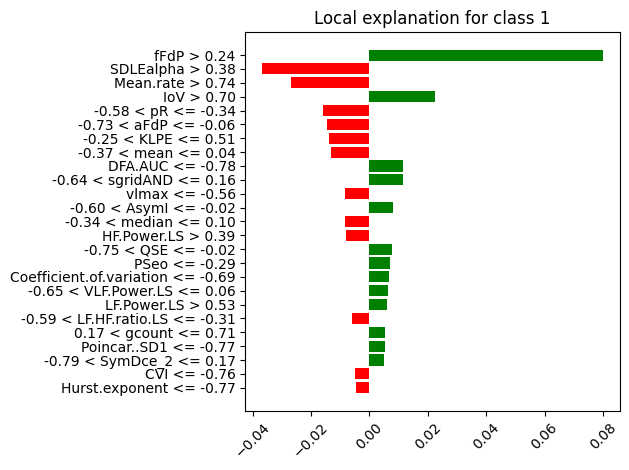

Explaining instance 2/5
Intercept 0.1033830539868011
Prediction_local [0.02468528]
Right: 0.038638856


[('KLPE > 0.51', -0.05254209972330373), ('-0.67 < fFdP <= -0.31', -0.02965204466786982), ('-0.34 < pR <= 0.18', 0.016960971266850162), ('-0.81 < Mean.rate <= -0.05', 0.01627191489297542), ('LF.HF.ratio.LS > 0.21', 0.016206335972681462), ('-0.73 < aFdP <= -0.06', -0.01605088321699332), ('LF.Power.LS > 0.53', 0.011608843294221176), ('0.06 < DFA.AUC <= 0.79', -0.00924885225421817), ('-0.02 < AsymI <= 0.60', -0.007807029199804349), ('-0.02 < QSE <= 0.73', -0.0074559615753893235), ('-0.20 < SDLEalpha <= 0.17', 0.007370090723617374), ('0.17 < gcount <= 0.71', 0.007362386985044758), ('-0.21 < PSeo <= 0.05', -0.006984031427198448), ('0.22 < MultiFractal_c2 <= 0.52', 0.006380911245688818), ('0.06 < VLF.Power.LS <= 0.67', -0.006302309845771615), ('-0.69 < Coefficient.of.variation <= -0.25', 0.0059535309522782374), ('0.26 < shannEn <= 0.74', -0.005696858231249917), ('DFA.Alpha.1 > 0.81', 0.005421247402638224), ('-0.54 < mean <= -0.37', -0.005021187273792795), ('0.06 < SymDfw_2 <= 0.83', -0.004929

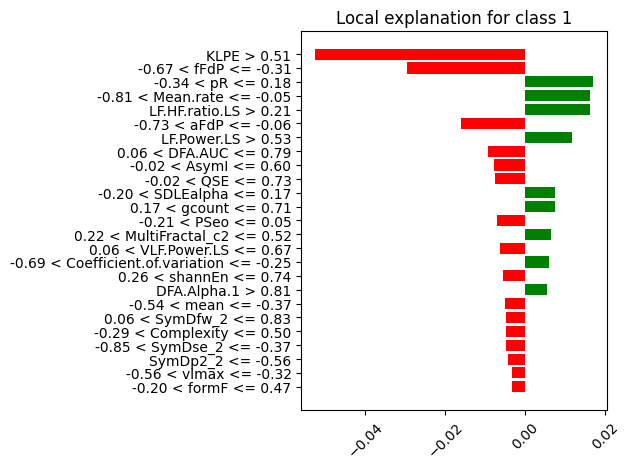

Explaining instance 3/5
Intercept 0.08354706891658545
Prediction_local [0.08161539]
Right: 0.008684783


[('KLPE > 0.51', -0.055748299646036566), ('aFdP > 0.56', 0.05329076494382962), ('ARerr > 0.57', -0.026492135667539236), ('-0.31 < fFdP <= 0.24', 0.026211056231200246), ('LF.HF.ratio.LS > 0.21', 0.016733028607606042), ('mean <= -0.54', 0.01671478677618196), ('AsymI > 0.60', -0.01640811436729092), ('LF.Power.LS <= -0.73', -0.01624117080408995), ('IoV <= -0.52', -0.015122416610199106), ('-0.58 < pR <= -0.34', -0.010330441687783461), ('-0.64 < sgridAND <= 0.16', 0.008411242256734848), ('-0.32 < vlmax <= 0.17', -0.00820107721137635), ('SDLEmean > 0.70', -0.0078730355880906), ('SymDce_2 > 0.83', 0.007117137143068428), ('0.17 < SDLEalpha <= 0.38', 0.006669420393494259), ('SymDp0_2 <= -0.40', 0.006655246389128212), ('-0.27 < Poincar..SD1 <= 0.48', -0.006573176520203774), ('eScaleE <= -0.38', 0.006394682305530748), ('-0.72 < MultiFractal_c1 <= -0.14', -0.005993202466741517), ('DFA.AUC > 0.79', 0.005766723695361763), ('-0.64 < gcount <= 0.17', 0.005655051133383268), ('CVI > 0.79', 0.004290523508

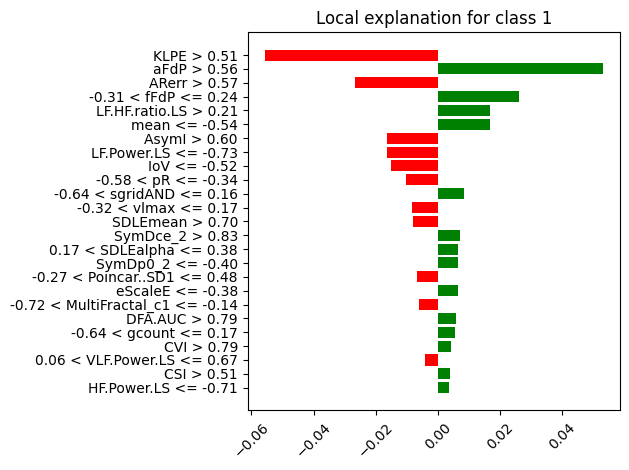

Explaining instance 4/5
Intercept 0.027911719663835856
Prediction_local [0.26265798]
Right: 0.16779362


[('fFdP > 0.24', 0.08510467538516496), ('aFdP > 0.56', 0.04493480421977448), ('Mean.rate > 0.74', -0.03092508674039734), ('IoV > 0.70', 0.028417244867812445), ('pR > 0.18', 0.015571679996125113), ('-0.25 < KLPE <= 0.51', -0.013059400146271355), ('VLF.Power.LS <= -0.65', 0.010671815367835022), ('DFA.AUC > 0.79', 0.010644439307931563), ('Power.Law.Y.Intercept.LS > 0.70', 0.010132119250471057), ('median > 0.10', 0.009132229419808228), ('SymDp2_2 > 0.11', 0.008573718117139148), ('sedl > 0.59', -0.008496167796673266), ('shannEn <= -0.52', 0.008208222540134001), ('LF.Power.LS > 0.53', 0.008015363262395674), ('pDpR <= -0.71', 0.007802981490779174), ('-0.31 < LF.HF.ratio.LS <= 0.21', 0.007564479751722435), ('-0.75 < CSI <= -0.20', 0.007373935755579003), ('-0.02 < AsymI <= 0.60', -0.007169074278655843), ('Power.Law.Slope.LS > 0.60', 0.006854747183142341), ('SymDp1_2 > 0.53', 0.006829743235330877), ('MultiFractal_c2 > 0.52', 0.006641833764563699), ('sgridAND <= -0.64', 0.006542396906115758), ('-

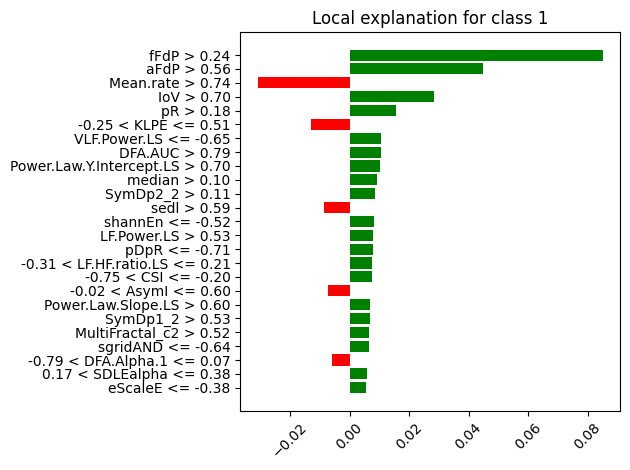

Explaining instance 5/5
Intercept 0.10985598906892269
Prediction_local [0.00790443]
Right: 0.017617796


[('KLPE > 0.51', -0.05388540942500838), ('SDLEalpha > 0.38', -0.038913018826228725), ('-0.67 < fFdP <= -0.31', -0.031962780539390216), ('ARerr > 0.57', -0.024352809202710306), ('-0.06 < aFdP <= 0.56', 0.02151863754967426), ('LF.HF.ratio.LS > 0.21', 0.020790120006234328), ('AsymI <= -0.60', 0.019858415071527566), ('LF.Power.LS <= -0.73', -0.016458982997041943), ('QSE > 0.73', -0.012764801632119011), ('MultiFractal_c1 <= -0.72', 0.012629148150685119), ('-0.34 < pR <= 0.18', 0.010696884879578641), ('HF.Power.LS <= -0.71', 0.010603388117229938), ('sedl > 0.59', -0.010326416105180872), ('-0.52 < IoV <= 0.10', -0.010119336472262213), ('0.06 < DFA.AUC <= 0.79', -0.009825585293560748), ('0.06 < VLF.Power.LS <= 0.67', -0.009735863688716324), ('-0.64 < sgridAND <= 0.16', 0.008763029208256591), ('SymDp1_2 > 0.53', 0.00813144916259983), ('dlmax > 0.06', -0.00788103927048889), ('-0.20 < MultiFractal_c2 <= 0.22', 0.007288057027785489), ('pDpR > 0.59', -0.006301630151372777), ('histSI <= -0.39', 0.00

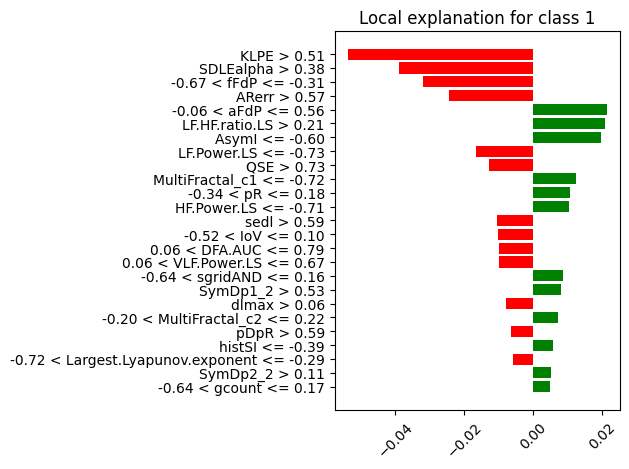

In [ ]:
import lime
import lime.lime_tabular
from lime import lime_tabular
explain_model_with_lime(X_train, X_val, xgb_boruta_sep_precision,bootstrap_features_sepsis3)

In [ ]:
def explain_model_with_lime_and_summarize(X_train, X_val, model, feature_names, num_instances=5):
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=feature_names,
        class_names=['0', '1'],
        verbose=True,
        mode='classification'
    )

    # Initialize an empty dictionary to store feature contributions
    feature_contributions = {}

    # Explain multiple instances
    for idx_to_explain in range(num_instances):
        print(f"Explaining instance {idx_to_explain+1}/{num_instances}")
        lime_exp = explainer.explain_instance(X_val[idx_to_explain], model.predict_proba,
                                              num_features=len(feature_names))

        # Collect feature contributions for this instance
        for feature, contribution in lime_exp.as_list():
            if feature not in feature_contributions:
                feature_contributions[feature] = []  # Initialize if feature name is encountered for the first time
            feature_contributions[feature].append(contribution)


        # lime_exp.show_in_notebook(show_table=True, show_all=False) # may need to disable or modify based on the environment

    # Summarize the feature contributions
    feature_summary = {feature: np.mean(contributions) for feature, contributions in feature_contributions.items()}

    # Sorting features by their average contribution magnitude
    sorted_features = sorted(feature_summary.items(), key=lambda x: abs(x[1]), reverse=True)

    # Displaying summarized feature importance
    for feature, importance in sorted_features:
        print(f"Feature: {feature}, Average Importance: {importance}")

    return sorted_features


explanation_summary = explain_model_with_lime_and_summarize(X_train, X_val, xgb_boruta_sep_precision,bootstrap_features_sepsis3, num_instances=863)

Explaining instance 1/863
Intercept 0.08027436788272507
Prediction_local [0.08973153]
Right: 0.2099833
Explaining instance 2/863
Intercept 0.1025398524745078
Prediction_local [0.04133755]
Right: 0.038638856
Explaining instance 3/863
Intercept 0.08991645557467717
Prediction_local [0.07360703]
Right: 0.008684783
Explaining instance 4/863
Intercept 0.02691877928499696
Prediction_local [0.25385884]
Right: 0.16779362
Explaining instance 5/863
Intercept 0.11190901427484802
Prediction_local [0.00340487]
Right: 0.017617796
Explaining instance 6/863
Intercept 0.04253219375669846
Prediction_local [0.20614887]
Right: 0.56340593
Explaining instance 7/863
Intercept 0.027614484878944995
Prediction_local [0.26619543]
Right: 0.3279789
Explaining instance 8/863
Intercept 0.05341221039558334
Prediction_local [0.17996657]
Right: 0.07392452
Explaining instance 9/863
Intercept 0.08825010729580623
Prediction_local [0.0699625]
Right: 0.019799974
Explaining instance 10/863
Intercept 0.047693137410887154
Predi

In [ ]:
data_lines_xboost_high_precision = """
Feature: fFdP > 0.24, Average Importance: 0.07929822659402844
Feature: fFdP <= -0.67, Average Importance: -0.07824706919540145
Feature: aFdP <= -0.73, Average Importance: -0.05370774439034065
Feature: aFdP > 0.56, Average Importance: 0.053176875924875716
Feature: KLPE > 0.51, Average Importance: -0.051993962955961405
Feature: KLPE <= -0.74, Average Importance: 0.0518216601374576
Feature: ARerr <= -0.79, Average Importance: 0.04130225288579106
Feature: SDLEalpha > 0.38, Average Importance: -0.0363829727603971
Feature: -0.31 < fFdP <= 0.24, Average Importance: 0.031138051144736167
Feature: -0.67 < fFdP <= -0.31, Average Importance: -0.030970008371782928
Feature: Mean.rate > 0.74, Average Importance: -0.029146153947962907
Feature: sgridAND > 0.71, Average Importance: -0.024763959660103203
Feature: IoV > 0.70, Average Importance: 0.024275565958796017
Feature: -0.28 < ARerr <= 0.57, Average Importance: -0.023674195107405777
Feature: ARerr > 0.57, Average Importance: -0.022079741407235752
Feature: SDLEalpha <= -0.20, Average Importance: 0.020962620520991224
Feature: LF.Power.LS <= -0.73, Average Importance: -0.019655067208224658
Feature: -0.06 < aFdP <= 0.56, Average Importance: 0.019227691734667936
Feature: -0.73 < aFdP <= -0.06, Average Importance: -0.01873330934665983
Feature: LF.HF.ratio.LS <= -0.59, Average Importance: -0.018499235574873922
Feature: MultiFractal_c2 <= -0.20, Average Importance: -0.018163131288312394
Feature: LF.HF.ratio.LS > 0.21, Average Importance: 0.017761583825461003
Feature: AsymI > 0.60, Average Importance: -0.017717513007650284
Feature: -0.74 < KLPE <= -0.25, Average Importance: 0.016522483911341004
Feature: -0.81 < Mean.rate <= -0.05, Average Importance: 0.016336789554648096
Feature: -0.05 < Mean.rate <= 0.74, Average Importance: 0.016283245325967373
Feature: -0.25 < KLPE <= 0.51, Average Importance: -0.016015659283939648
Feature: -0.20 < LF.Power.LS <= 0.53, Average Importance: 0.01590875965335867
Feature: mean <= -0.54, Average Importance: 0.0150795368236681
Feature: AsymI <= -0.60, Average Importance: 0.014418570182749576
Feature: pR > 0.18, Average Importance: 0.013784317071776808
Feature: HF.Power.LS <= -0.71, Average Importance: 0.013257022511782289
Feature: IoV <= -0.52, Average Importance: -0.013237104343359082
Feature: -0.37 < mean <= 0.04, Average Importance: -0.01302541864716416
Feature: -0.58 < pR <= -0.34, Average Importance: -0.012181909748638212
Feature: pR <= -0.58, Average Importance: -0.012108703360744075
Feature: VLF.Power.LS <= -0.65, Average Importance: 0.011556403201912634
Feature: -0.52 < IoV <= 0.10, Average Importance: -0.011044372391785424
Feature: -0.34 < pR <= 0.18, Average Importance: 0.01098442016759226
Feature: sgridAND <= -0.64, Average Importance: 0.010969744474180362
Feature: sedl <= -0.62, Average Importance: 0.010214390081268357
Feature: QSE > 0.73, Average Importance: -0.010014795646039762
Feature: QSE <= -0.75, Average Importance: 0.009814613829467899
Feature: LF.Power.LS > 0.53, Average Importance: 0.009700732797672293
Feature: -0.20 < SDLEalpha <= 0.17, Average Importance: 0.009587318785191246
Feature: 0.06 < DFA.AUC <= 0.79, Average Importance: -0.008960900673615558
Feature: -0.64 < sgridAND <= 0.16, Average Importance: 0.008582665288823645
Feature: gcount > 0.71, Average Importance: -0.008573685654940124
Feature: median > 0.10, Average Importance: 0.008571869173762495
Feature: shannEn <= -0.52, Average Importance: 0.008404433779846324
Feature: MultiFractal_c1 <= -0.72, Average Importance: 0.00834138174303439
Feature: DFA.AUC > 0.79, Average Importance: 0.008193788528858636
Feature: Power.Law.Slope.LS > 0.60, Average Importance: 0.007849859919087258
Feature: MultiFractal_c2 > 0.52, Average Importance: 0.007737830684294242
Feature: -0.21 < PSeo <= 0.05, Average Importance: -0.0074995780041870125
Feature: VLF.Power.LS > 0.67, Average Importance: -0.007302933777191413
Feature: DFA.AUC <= -0.78, Average Importance: 0.006896261160748276
Feature: -0.75 < QSE <= -0.02, Average Importance: 0.0068447451265734845
Feature: 0.22 < MultiFractal_c2 <= 0.52, Average Importance: 0.006807138264612494
Feature: -0.60 < AsymI <= -0.02, Average Importance: 0.006715993727908132
Feature: 0.26 < shannEn <= 0.74, Average Importance: -0.006628189675261688
Feature: -0.14 < Correlation.dimension <= 0.58, Average Importance: 0.006586596403467728
Feature: HF.Power.LS > 0.39, Average Importance: -0.006443295232767942
Feature: -0.02 < QSE <= 0.73, Average Importance: -0.006423184650901672
Feature: 0.06 < VLF.Power.LS <= 0.67, Average Importance: -0.006328288641223809
Feature: SymDp2_2 > 0.11, Average Importance: 0.006309865586365852
Feature: vlmax > 0.17, Average Importance: 0.006294417463175029
Feature: pDpR > 0.59, Average Importance: -0.006074189365316148
Feature: -0.78 < DFA.AUC <= 0.06, Average Importance: -0.0060525089697436195
Feature: sedl > 0.59, Average Importance: -0.005776590595644218
Feature: 0.16 < sgridAND <= 0.71, Average Importance: 0.005662217688178697
Feature: SDLEmean > 0.70, Average Importance: -0.005321488878158786
Feature: -0.73 < LF.Power.LS <= -0.20, Average Importance: -0.005261686378191057
Feature: Teo > 0.15, Average Importance: 0.0051953657036609485
Feature: -0.31 < HF.Power.LS <= 0.39, Average Importance: -0.0051866131758056735
Feature: 0.17 < SDLEalpha <= 0.38, Average Importance: 0.005032534339182654
Feature: Poincar..SD1 <= -0.77, Average Importance: 0.005024912476698458
Feature: SymDce_2 <= -0.79, Average Importance: -0.0050217603471283635
Feature: PSeo > 0.05, Average Importance: 0.004967884330084043
Feature: SymDp1_2 <= -0.76, Average Importance: -0.004942186236889682
Feature: eScaleE <= -0.38, Average Importance: 0.0048627716434343935
Feature: -0.64 < gcount <= 0.17, Average Importance: 0.004825964042114192
Feature: -0.79 < ARerr <= -0.28, Average Importance: 0.004419654776723433
Feature: -0.20 < MultiFractal_c2 <= 0.22, Average Importance: 0.004415711982417197
Feature: -0.72 < MultiFractal_c1 <= -0.14, Average Importance: -0.004408868943394453
Feature: Poincar..SD2 > 0.39, Average Importance: 0.004325894460949435
Feature: Coefficient.of.variation <= -0.69, Average Importance: 0.0040802094944864834
Feature: -0.56 < Teo <= -0.37, Average Importance: -0.003994079656518869
Feature: SymDp2_2 <= -0.56, Average Importance: -0.00389851211002729
Feature: Hurst.exponent > 0.78, Average Importance: 0.003822290251390713
Feature: Power.Law.Y.Intercept.LS <= -0.69, Average Importance: -0.003745206711729139
Feature: Correlation.dimension > 0.58, Average Importance: -0.0037220774816532614
Feature: -0.03 < sedl <= 0.59, Average Importance: -0.003715737055522543
Feature: Power.Law.Y.Intercept.LS > 0.70, Average Importance: 0.003707363059368843
Feature: SymDce_2 > 0.83, Average Importance: 0.0036360549117911297
Feature: dlmax <= -0.50, Average Importance: 0.0035258071042626785
Feature: DFA.Alpha.1 <= -0.79, Average Importance: 0.0035218562487920567
Feature: SDLEmean <= -0.35, Average Importance: 0.0034879994153057814
Feature: Hurst.exponent <= -0.77, Average Importance: -0.0034796448424766497
Feature: pDpR <= -0.71, Average Importance: 0.0034299181842854954
Feature: -0.31 < LF.HF.ratio.LS <= 0.21, Average Importance: 0.003351388186673777
Feature: shannEn > 0.74, Average Importance: -0.003227320481760045
Feature: -0.68 < Power.Law.Slope.LS <= -0.07, Average Importance: -0.0032063205980147683
Feature: Mean.rate <= -0.81, Average Importance: -0.0031472570487420903
Feature: gcount <= -0.64, Average Importance: 0.0031256989424738677
Feature: DFA.Alpha.2 <= -0.50, Average Importance: 0.0030798236163134584
Feature: eScaleE > 0.42, Average Importance: -0.003068488017742052
Feature: -0.54 < mean <= -0.37, Average Importance: -0.0030187254367728313
Feature: Correlation.dimension <= -0.75, Average Importance: -0.0030057582657815633
Feature: -0.02 < AsymI <= 0.60, Average Importance: -0.0029870374667518166
Feature: sgridTAU <= -0.62, Average Importance: 0.0029820873796271505
Feature: -0.27 < Poincar..SD1 <= 0.48, Average Importance: -0.002906743424496703
Feature: SymDp1_2 > 0.53, Average Importance: 0.0028753594290905986
Feature: -0.14 < MultiFractal_c1 <= 0.57, Average Importance: -0.002790795535725707
Feature: PSeo <= -0.29, Average Importance: 0.0027769651644272203
Feature: -0.59 < LF.HF.ratio.LS <= -0.31, Average Importance: -0.002746943603562305
Feature: 0.07 < DFA.Alpha.1 <= 0.81, Average Importance: -0.002671806270321548
Feature: histSI <= -0.39, Average Importance: 0.0026613155801794236
Feature: -0.28 < Poincar..SD2 <= 0.39, Average Importance: -0.002565728635210224
Feature: sgridTAU > 0.81, Average Importance: -0.0024869871295338792
Feature: Power.Law.Slope.LS <= -0.68, Average Importance: -0.002343760346078644
Feature: -0.67 < Poincar..SD2 <= -0.28, Average Importance: -0.00233790530735036
Feature: -0.56 < vlmax <= -0.32, Average Importance: -0.0022225581727215644
Feature: vlmax <= -0.56, Average Importance: -0.0022166219285175426
Feature: -0.65 < VLF.Power.LS <= 0.06, Average Importance: 0.002212794053696349
Feature: median <= -0.34, Average Importance: -0.0021122689768045427
Feature: dlmax > 0.06, Average Importance: -0.0020789505946941125
Feature: Coefficient.of.variation > 0.44, Average Importance: -0.002046354431890421
Feature: -0.39 < histSI <= 0.26, Average Importance: -0.002045262163884294
Feature: -0.07 < Power.Law.Slope.LS <= 0.60, Average Importance: -0.002014135116393444
Feature: -0.29 < Largest.Lyapunov.exponent <= 0.43, Average Importance: -0.001976888991636572
Feature: -0.75 < Complexity <= -0.29, Average Importance: -0.0019228782652108885
Feature: -0.29 < Complexity <= 0.50, Average Importance: 0.0019214327780777537
Feature: -0.38 < eScaleE <= 0.07, Average Importance: -0.0018790090057749084
Feature: Largest.Lyapunov.exponent > 0.43, Average Importance: 0.001850978424637048
Feature: CSI > 0.51, Average Importance: 0.0017923685235352413
Feature: -0.56 < SymDp2_2 <= -0.39, Average Importance: -0.0017628043613898568
Feature: -0.44 < SymDp1_2 <= 0.53, Average Importance: 0.0016914040506858384
Feature: Complexity <= -0.75, Average Importance: -0.0016862955447404795
Feature: Complexity > 0.50, Average Importance: 0.0016751105379340392
Feature: -0.79 < DFA.Alpha.1 <= 0.07, Average Importance: -0.0016362510888909916
Feature: formF > 0.47, Average Importance: 0.0016036883456656131
Feature: -0.52 < shannEn <= 0.26, Average Importance: 0.0015647982080854205
Feature: sgridWGT <= -0.59, Average Importance: 0.001550555928846083
Feature: 0.15 < DFA.Alpha.2 <= 0.67, Average Importance: -0.0015474052248425233
Feature: DFA.Alpha.2 > 0.67, Average Importance: -0.0015341403667522855
Feature: CVI <= -0.76, Average Importance: 0.001532781188187915
Feature: -0.77 < Poincar..SD1 <= -0.27, Average Importance: -0.0015319225533260445
Feature: formF <= -0.74, Average Importance: -0.0014329352334391313
Feature: -0.32 < vlmax <= 0.17, Average Importance: -0.0014301824969478881
Feature: -0.69 < Power.Law.Y.Intercept.LS <= 0.04, Average Importance: -0.0013337382754282357
Feature: 0.26 < histSI <= 0.69, Average Importance: -0.0013304980596023457
Feature: -0.39 < SymDp2_2 <= 0.11, Average Importance: -0.0013215490206885368
Feature: Poincar..SD1 > 0.48, Average Importance: -0.0013182777151143701
Feature: -0.71 < pDpR <= -0.04, Average Importance: 0.0012833231717438477
Feature: -0.35 < SDLEmean <= 0.43, Average Importance: 0.0011676516073498217
Feature: 0.26 < sgridWGT <= 0.77, Average Importance: -0.0011347871503895387
Feature: -0.69 < Coefficient.of.variation <= -0.25, Average Importance: -0.0010720987528481916
Feature: -0.25 < Coefficient.of.variation <= 0.44, Average Importance: -0.0010580681162020535
Feature: 0.17 < gcount <= 0.71, Average Importance: 0.0009865296368582075
Feature: -0.77 < Hurst.exponent <= -0.31, Average Importance: 0.0009826479145854919
Feature: -0.34 < median <= 0.10, Average Importance: -0.0009733553696759551
Feature: -0.79 < SymDce_2 <= 0.17, Average Importance: 0.0009496876923554654
Feature: 0.04 < Power.Law.Y.Intercept.LS <= 0.70, Average Importance: 0.0009268617640220936
Feature: 0.43 < SDLEmean <= 0.70, Average Importance: 0.0009203833365759023
Feature: -0.75 < CSI <= -0.20, Average Importance: -0.0009113591545971815
Feature: 0.24 < sgridTAU <= 0.81, Average Importance: -0.0009008925955692574
Feature: -0.04 < pDpR <= 0.59, Average Importance: 0.0008939269273172528
Feature: mean > 0.04, Average Importance: 0.0008687348241906599
Feature: -0.33 < dlmax <= 0.06, Average Importance: -0.0008303884640524576
Feature: SymDp0_2 <= -0.40, Average Importance: 0.0008028823261983312
Feature: SymDse_2 <= -0.85, Average Importance: -0.0007995763379996221
Feature: -0.75 < Correlation.dimension <= -0.14, Average Importance: 0.000790902373046225
Feature: DFA.Alpha.1 > 0.81, Average Importance: 0.0007645607605636334
Feature: 0.17 < SymDce_2 <= 0.83, Average Importance: 0.000729147558487716
Feature: Poincar..SD2 <= -0.67, Average Importance: 0.0007195144577986225
Feature: -0.74 < formF <= -0.20, Average Importance: -0.0006603839476210244
Feature: Largest.Lyapunov.exponent <= -0.72, Average Importance: 0.0006439955056104353
Feature: -0.31 < Hurst.exponent <= 0.78, Average Importance: -0.0006310443708043329
Feature: CSI <= -0.75, Average Importance: -0.0006084870863590622
Feature: -0.76 < SymDp1_2 <= -0.44, Average Importance: 0.000563723769204122
Feature: Teo <= -0.56, Average Importance: -0.0005574267230240274
Feature: -0.40 < SymDp0_2 <= 0.43, Average Importance: -0.0005555324729096453
Feature: -0.90 < SymDfw_2 <= 0.06, Average Importance: -0.0005438290057806571
Feature: sgridWGT > 0.77, Average Importance: 0.0005394660459325069
Feature: -0.71 < HF.Power.LS <= -0.31, Average Importance: -0.0004991631759760705
Feature: SymDp0_2 > 0.72, Average Importance: -0.0004908164961433084
Feature: -0.37 < Teo <= 0.15, Average Importance: -0.00046658834263425635
Feature: -0.76 < CVI <= 0.06, Average Importance: -0.0004605776018764656
Feature: MultiFractal_c1 > 0.57, Average Importance: -0.0004535291657168324
Feature: -0.20 < CSI <= 0.51, Average Importance: 0.0004265994284559588
Feature: -0.20 < formF <= 0.47, Average Importance: 0.000380770323435826
Feature: 0.06 < CVI <= 0.79, Average Importance: -0.0003793641713160611
Feature: -0.62 < sgridTAU <= 0.24, Average Importance: 0.0003778230290126111
Feature: 0.10 < IoV <= 0.70, Average Importance: 0.0003293168482877767
Feature: -0.50 < DFA.Alpha.2 <= 0.15, Average Importance: 0.00029835157699922583
Feature: CVI > 0.79, Average Importance: 0.00028652037581144
Feature: 0.43 < SymDp0_2 <= 0.72, Average Importance: -0.00028619399441936767
Feature: SymDfw_2 > 0.83, Average Importance: 0.0002708461766054973
Feature: -0.85 < SymDse_2 <= -0.37, Average Importance: 0.00025915804752289827
Feature: -0.29 < PSeo <= -0.21, Average Importance: -0.00023237744910413553
Feature: SymDse_2 > 0.72, Average Importance: 0.00013739279418185848
Feature: -0.72 < Largest.Lyapunov.exponent <= -0.29, Average Importance: 0.00011203070732347859
Feature: -0.59 < sgridWGT <= 0.26, Average Importance: 0.00010998570047299757
Feature: 0.06 < SymDfw_2 <= 0.83, Average Importance: 9.043102534753107e-05
Feature: -0.62 < sedl <= -0.03, Average Importance: -8.722190464843975e-05
Feature: -0.50 < dlmax <= -0.33, Average Importance: -7.446321598142514e-05
Feature: -0.37 < SymDse_2 <= 0.72, Average Importance: 4.998764434935809e-05
Feature: histSI > 0.69, Average Importance: 4.6128849292825665e-05
Feature: SymDfw_2 <= -0.90, Average Importance: 4.140030372440885e-05
Feature: 0.07 < eScaleE <= 0.42, Average Importance: -2.0010295143118298e-06
"""

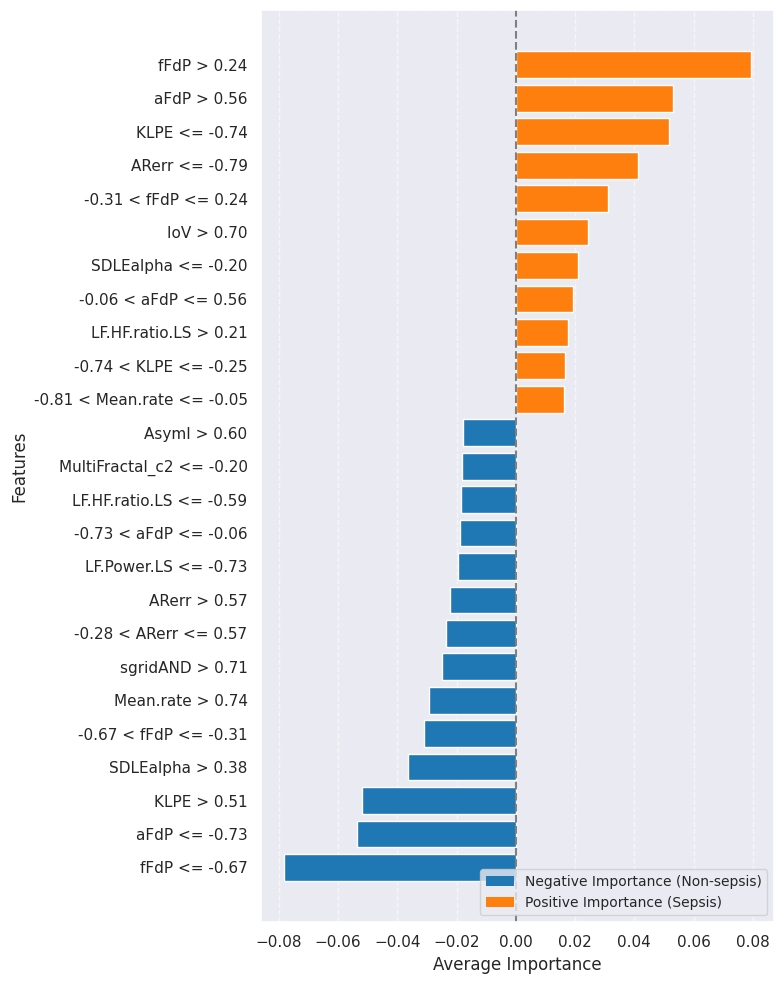

In [ ]:
import matplotlib.pyplot as plt



n = 25  # Desired number of top features to display

features = []
average_importances = []

data_lines = data_lines_xboost_high_precision.strip().split("\n")

for line in data_lines:
    parts = line.split(", Average Importance: ")
    feature = parts[0].replace("Feature: ", "")
    importance = float(parts[1])
    features.append(feature)
    average_importances.append(importance)

abs_importances = [abs(imp) for imp in average_importances]

combined_data = list(zip(features, average_importances, abs_importances))

top_combined_data = sorted(combined_data, key=lambda x: x[2], reverse=True)[:n]

top_features, top_importances, _ = zip(*top_combined_data)

importances_sorted, features_sorted = zip(*sorted(zip(top_importances, top_features)))


plt.figure(figsize=(8, 10))
colors = ['#1f77b4' if imp < 0 else '#ff7f0e' for imp in importances_sorted]  # Blue and orange color palette
plt.barh(features_sorted, importances_sorted, color=colors)
plt.xlabel("Average Importance", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.axvline(x=0, color='grey', linestyle='--')
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Legend with larger fonts
red_bar = plt.Rectangle((0,0),1,1,fc="#1f77b4", edgecolor = 'none')
green_bar = plt.Rectangle((0,0),1,1,fc='#ff7f0e', edgecolor = 'none')
plt.legend([red_bar, green_bar], ['Negative Importance (Non-sepsis)', 'Positive Importance (Sepsis)'], loc='lower right', ncol=1, prop={'size':10})

plt.tight_layout()
plt.savefig('Fig7-explain-xgboost_plot.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

    Analysis from 10 explanations:
    
    Low Frequency/High Frequency (LF/HF) Ratio: The average importance of LF.HF.ratio.LS > 0.21 being positive (0.01893907150929673) underlines the significance of this feature in predicting sepsis, reinforcing the sentiment about its vital role in differentiating physiological responses leading to sepsis. This affirms the model's ability to recognize autonomic imbalances implicated in sepsis.

    Mean Rate: Interestingly, Mean.rate > 0.74 has a negative average importance (-0.02794918553667844), whereas -0.81 < Mean.rate <= -0.05 shows positive importance (0.020790602692575554). This inverse relationship requires context regarding the model's interpretability regarding mean rate values; however, it still points towards the mean rate being a factor the model takes into account significantly.

    Hurst Exponent and Complexity Levels: In this dataset, the Hurst exponent (Hurst.exponent <= -0.77 with negative importance and Hurst.exponent > 0.78 with positive importance) and Complexity (Complexity <= -0.75 with negative importance and -0.29 < Complexity <= 0.50 with positive importance) do show up, indicating their influence in the model predictions, although their effects are highly nuanced. Notably, both higher and lower thresholds of the Hurst exponent are considered, suggesting the model captures a broad spectrum of autonomic system behaviors.

    Asymmetry Index (AsymI): The presence of both AsymI <= -0.60 with positive importance and AsymI > 0.60 with negative importance highlights the model's attention to asymmetry in the autonomic nervous system's response, which can be relevant in physiological stress responses such as sepsis.

    Other Relevant Features: Features such as fFdP > 0.24 with positive importance and KLPE > 0.51 with negative importance also indicate the model’s consideration of various HRV measures.

    fFdP: This could represent a feature related to frequency domain analysis of HRV. In frequency domain measures of HRV, parameters such as LF (Low Frequency), HF (High Frequency), and VLF (Very Low Frequency) are common. "fFdP" might be a specific marker derived from such frequency domain analyses, possibly indicating a particular power density or a ratio.

    KLPE: This could stand for a measure related to entropy or non-linear dynamics within HRV analysis. In the realm of non-linear HRV metrics, measures such as sample entropy, approximate entropy, and multiscale entropy are used to assess the complexity of heart rate dynamics. "KLPE" might indicate a specific type of entropy measure, possibly related to Kullback-Leibler divergence (a measure of how one probability distribution diverges from a second, expected probability distribution) combined with permutation entropy (a type of entropy measure that assesses the complexity of a time series) or another complexity metric.

# Explanability for Neural Network

In [ ]:
def keras_predict_proba_wrapper(model):
    def predict_proba(X):
        # Use model's predict method to get the predicted probabilities
        preds = model.predict(X)

        if model.output_shape[-1] == 1:  # Binary classification model
            # For binary classification, 'predict' might output a single probability per instance (assuming positive class)
            # We need to convert this to a two-dimensional array with probabilities for both classes (0 and 1)
            return np.hstack([1-preds, preds])
        else:  # Multiclass classification model
            # For multiclass, 'predict' should already output probabilities per class
            return preds
    return predict_proba

In [ ]:
from tensorflow.keras.models import load_model



custom_objects = {
    "precision": precision,  # reference to  precision function
    "recall": recall,        # reference to  recall function
    "f1": f1                 # reference to  f1 function
}

model_save_path = '/model/neural_net_80_85_76_f1_pre_recall.h5'
loaded_model = load_model(model_save_path, custom_objects=custom_objects)
loaded_model_predict_proba = keras_predict_proba_wrapper(loaded_model)


In [ ]:

loaded_model_predict_proba = keras_predict_proba_wrapper(loaded_model)

# Random test input, replace with appropriate shape and data for your model
import numpy as np
test_input = np.random.rand(1, X_train.shape[1])  # Update with correct input shape
test_output = loaded_model_predict_proba(test_input)
print(test_output)  # Verify this prints expected predictions

1/1 [==============================] - 0s 446ms/step
[[0.91969234 0.08030764]]


In [ ]:
X = new_df[boruta_bootstrap_features_sepsis3]
y = new_df['Sepsis3']
X_scaled, y = normalize_data(X, y)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=0.75, stratify=y, random_state=0)

In [ ]:
#!pip install lime

In [ ]:
import lime
import lime.lime_tabular
from lime import lime_tabular

In [ ]:
def explain_model_with_lime_and_summarize(X_train, X_val, model_predict_proba, feature_names, num_instances=5):
    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=feature_names,
        class_names=['0', '1'],
        verbose=True,
        mode='classification'
    )

    # Initialize an empty dictionary to store feature contributions
    feature_contributions = {}

    # Explain multiple instances
    for idx_to_explain in range(min(num_instances, len(X_val))):
        print(f"Explaining instance {idx_to_explain+1}/{num_instances}")
        # Directly use the wrapped model prediction function
        lime_exp = explainer.explain_instance(X_val[idx_to_explain], model_predict_proba,
                                              num_features=len(feature_names))

        # Collect feature contributions for this instance
        for feature, contribution in lime_exp.as_list():
            if feature not in feature_contributions:
                feature_contributions[feature] = []
            feature_contributions[feature].append(contribution)


        # lime_exp.show_in_notebook(show_table=True, show_all=False)

    # Summarize the feature contributions
    feature_summary = {feature: np.mean(contributions) for feature, contributions in feature_contributions.items()}

    # Sorting features by their average contribution magnitude
    sorted_features = sorted(feature_summary.items(), key=lambda x: abs(x[1]), reverse=True)

    # Displaying summarized feature importance
    for feature, importance in sorted_features:
        print(f"Feature: {feature}, Average Importance: {importance}")

    return sorted_features

In [ ]:
explanation_neural_summary = explain_model_with_lime_and_summarize(X_train, X_test, loaded_model_predict_proba,feature_names=bootstrap_features_sepsis3, num_instances=1079)

Streaming output truncated to the last 5000 lines.
Prediction_local [0.01601669]
Right: 9.396232e-06
Explaining instance 113/1079
157/157 [==============================] - 0s 2ms/step
Intercept 0.0859080816066004
Prediction_local [0.05935997]
Right: 0.03639666
Explaining instance 114/1079
157/157 [==============================] - 0s 3ms/step
Intercept 0.11929396840594075
Prediction_local [-0.03130534]
Right: 0.00020140667
Explaining instance 115/1079
157/157 [==============================] - 0s 2ms/step
Intercept 0.04342862293014508
Prediction_local [0.19740907]
Right: 0.06592147
Explaining instance 116/1079
157/157 [==============================] - 0s 2ms/step
Intercept 0.0453467561845813
Prediction_local [0.1752732]
Right: 0.00072411186
Explaining instance 117/1079
157/157 [==============================] - 0s 2ms/step
Intercept 0.0723127815227834
Prediction_local [0.09912731]
Right: 0.0049247136
Explaining instance 118/1079
157/157 [==============================] - 0s 2ms/step


In [ ]:
data_lines_neural = """
Feature: vlmax > 0.55, Average Importance: 0.1253770647743344
Feature: vlmax <= -0.73, Average Importance: -0.08294103194914076
Feature: shannEn > 0.24, Average Importance: 0.06568411512388186
Feature: dlmax > 0.10, Average Importance: 0.052426435480218844
Feature: Teo > 0.49, Average Importance: -0.05190921958826374
Feature: Power.Law.Slope.LS <= -0.80, Average Importance: 0.04949392737740783
Feature: Teo <= -0.73, Average Importance: 0.047450603754658253
Feature: shannEn <= -0.67, Average Importance: -0.045808087380886764
Feature: Poincar..SD2 > 0.36, Average Importance: 0.045283299060985514
Feature: -0.73 < vlmax <= -0.07, Average Importance: -0.0438083470177313
Feature: Power.Law.Slope.LS > 0.77, Average Importance: -0.03963938084876098
Feature: SymDfw_2 > 0.54, Average Importance: -0.03471436934353653
Feature: Power.Law.Y.Intercept.LS <= -0.67, Average Importance: 0.033519879170684004
Feature: SymDfw_2 <= -0.80, Average Importance: 0.03289265110318026
Feature: Power.Law.Y.Intercept.LS > 0.67, Average Importance: -0.03166075609222324
Feature: LF.HF.ratio.LS > 0.18, Average Importance: 0.022850146974873572
Feature: DFA.Alpha.1 > 0.79, Average Importance: 0.022813190575984903
Feature: Poincar..SD2 <= -0.68, Average Importance: -0.022733173173002285
Feature: DFA.Alpha.1 <= -0.82, Average Importance: -0.022387713124343553
Feature: -0.67 < shannEn <= -0.31, Average Importance: -0.022218403165407265
Feature: dlmax <= -0.56, Average Importance: -0.021935396794038862
Feature: sgridAND > 0.70, Average Importance: 0.02062944533998314
Feature: -0.56 < dlmax <= -0.40, Average Importance: -0.020265892600485412
Feature: Poincar..SD1 > 0.47, Average Importance: -0.019022398426215458
Feature: KLPE <= -0.60, Average Importance: 0.018489256010189987
Feature: -0.73 < Teo <= -0.25, Average Importance: 0.017689764666603033
Feature: PSeo > 0.72, Average Importance: 0.0175603687985103
Feature: 0.03 < Power.Law.Slope.LS <= 0.77, Average Importance: -0.01742170803416831
Feature: formF <= -0.21, Average Importance: 0.016642414185720062
Feature: -0.68 < Poincar..SD2 <= -0.30, Average Importance: -0.016289088310663186
Feature: LF.Power.LS <= -0.74, Average Importance: -0.015953485044508373
Feature: SymDce_2 <= -0.21, Average Importance: -0.015646144051601814
Feature: pR > 0.13, Average Importance: 0.0153854368904062
Feature: LF.Power.LS > 0.51, Average Importance: 0.015343327308908025
Feature: LF.HF.ratio.LS <= -0.58, Average Importance: -0.014385303097377903
Feature: formF > 0.38, Average Importance: -0.013797142183309768
Feature: KLPE > 0.80, Average Importance: -0.013451390131854335
Feature: Poincar..SD1 <= -0.78, Average Importance: 0.013432772064648017
Feature: AsymI > 0.76, Average Importance: 0.01306887832583203
Feature: pDpR > 0.70, Average Importance: -0.012947735921386592
Feature: aFdP > 0.09, Average Importance: 0.012794816068867522
Feature: -0.25 < Teo <= 0.49, Average Importance: -0.01277830010301212
Feature: sgridAND <= -0.77, Average Importance: -0.012409139131511478
Feature: pDpR <= -0.66, Average Importance: 0.012394825510802237
Feature: AsymI <= -0.60, Average Importance: -0.012350894733106434
Feature: -0.80 < SymDfw_2 <= -0.30, Average Importance: 0.011202154581694924
Feature: -0.30 < SymDfw_2 <= 0.54, Average Importance: -0.010639721171894776
Feature: -0.40 < dlmax <= 0.10, Average Importance: -0.010462787304356945
Feature: PSeo <= -0.52, Average Importance: -0.010008015349786136
Feature: SymDce_2 > 0.53, Average Importance: 0.009965647060022183
Feature: sgridWGT > 0.04, Average Importance: 0.009488058821962277
Feature: DFA.Alpha.2 > 0.60, Average Importance: -0.009056310318651816
Feature: Largest.Lyapunov.exponent > 0.61, Average Importance: 0.008939335516988257
Feature: sgridTAU > 0.79, Average Importance: 0.008898338060758815
Feature: SymDp2_2 > 0.77, Average Importance: 0.008525443910769634
Feature: -0.52 < PSeo <= 0.11, Average Importance: -0.008403005382097194
Feature: -0.58 < LF.HF.ratio.LS <= -0.31, Average Importance: -0.008344607541711107
Feature: 0.06 < Power.Law.Y.Intercept.LS <= 0.67, Average Importance: -0.008311294318949931
Feature: SymDp2_2 <= -0.76, Average Importance: -0.008107100681368645
Feature: VLF.Power.LS > 0.16, Average Importance: -0.007883383830118192
Feature: 0.23 < KLPE <= 0.80, Average Importance: -0.007835037854264404
Feature: Largest.Lyapunov.exponent <= -0.69, Average Importance: -0.0078089774831292865
Feature: -0.79 < Mean.rate <= -0.04, Average Importance: 0.007685696735054537
Feature: -0.67 < Power.Law.Y.Intercept.LS <= 0.06, Average Importance: 0.007657598178796706
Feature: DFA.AUC > 0.50, Average Importance: -0.0075893071507261295
Feature: -0.77 < sgridAND <= -0.05, Average Importance: -0.007559515214477178
Feature: sedl <= -0.66, Average Importance: -0.007517526085124832
Feature: sgridTAU <= -0.75, Average Importance: -0.007330951043198079
Feature: -0.80 < Power.Law.Slope.LS <= 0.03, Average Importance: 0.00711279192318747
Feature: SymDp1_2 > 0.50, Average Importance: 0.006922284922837415
Feature: -0.82 < DFA.Alpha.1 <= 0.04, Average Importance: -0.006904510273128678
Feature: 0.04 < DFA.Alpha.1 <= 0.79, Average Importance: 0.006697019255228817
Feature: -0.78 < Poincar..SD1 <= -0.28, Average Importance: 0.006682988624087525
Feature: -0.30 < Poincar..SD2 <= 0.36, Average Importance: -0.006194803374820711
Feature: pR <= -0.56, Average Importance: -0.006090135529346875
Feature: HF.Power.LS <= -0.71, Average Importance: -0.005636198922744274
Feature: Correlation.dimension > 0.71, Average Importance: -0.005302964950719381
Feature: -0.22 < LF.Power.LS <= 0.51, Average Importance: 0.004995425223829084
Feature: SymDp1_2 <= -0.76, Average Importance: -0.004939752364632237
Feature: -0.56 < pR <= -0.37, Average Importance: -0.004873377624561873
Feature: Mean.rate > 0.75, Average Importance: -0.004871610516193585
Feature: 0.22 < SymDce_2 <= 0.53, Average Importance: 0.004579184675103034
Feature: -0.74 < LF.Power.LS <= -0.22, Average Importance: -0.004465574770003066
Feature: Mean.rate <= -0.79, Average Importance: -0.004344637452651578
Feature: VLF.Power.LS <= -0.55, Average Importance: 0.004293544498393551
Feature: aFdP <= -0.33, Average Importance: -0.00423652350645943
Feature: -0.37 < pR <= 0.13, Average Importance: -0.004187148339042517
Feature: Complexity > 0.73, Average Importance: -0.004160804737501656
Feature: SymDse_2 > 0.59, Average Importance: 0.0040539851992305595
Feature: -0.28 < DFA.AUC <= 0.50, Average Importance: 0.003938174112837765
Feature: DFA.Alpha.2 <= -0.75, Average Importance: 0.003924007184780448
Feature: eScaleE > 0.03, Average Importance: -0.003918164026713625
Feature: Correlation.dimension <= -0.70, Average Importance: 0.0038529022290372215
Feature: -0.31 < shannEn <= 0.24, Average Importance: 0.0037211037005940722
Feature: 0.25 < AsymI <= 0.76, Average Importance: 0.0036345718889629025
Feature: -0.37 < sgridWGT <= 0.04, Average Importance: -0.0036146010105223753
Feature: -0.60 < AsymI <= 0.25, Average Importance: -0.003532260000898876
Feature: 0.17 < sedl <= 0.71, Average Importance: 0.003464986242988104
Feature: HF.Power.LS > 0.42, Average Importance: 0.003392043628680594
Feature: Complexity <= -0.54, Average Importance: 0.0033824933641221936
Feature: 0.15 < pDpR <= 0.70, Average Importance: -0.003345843039533469
Feature: -0.76 < SymDp2_2 <= 0.04, Average Importance: -0.003342872660323451
Feature: -0.07 < vlmax <= 0.55, Average Importance: 0.003214269168338275
Feature: -0.69 < Largest.Lyapunov.exponent <= -0.08, Average Importance: -0.003202449944112828
Feature: -0.75 < sgridTAU <= -0.30, Average Importance: -0.003173005579262572
Feature: fFdP > 0.67, Average Importance: -0.003134930076410565
Feature: -0.75 < DFA.Alpha.2 <= -0.14, Average Importance: 0.00312067779669261
Feature: -0.55 < VLF.Power.LS <= -0.32, Average Importance: 0.0030539324171276073
Feature: -0.74 < DFA.AUC <= -0.28, Average Importance: 0.0030192342472826375
Feature: -0.04 < Mean.rate <= 0.75, Average Importance: 0.002856582584794878
Feature: -0.30 < HF.Power.LS <= 0.42, Average Importance: 0.0028408855979420245
Feature: gcount <= -0.38, Average Importance: 0.002835718896331606
Feature: -0.53 < sgridWGT <= -0.37, Average Importance: -0.0028348102446688794
Feature: -0.66 < sedl <= 0.17, Average Importance: 0.0028092948885863962
Feature: sedl > 0.71, Average Importance: 0.002777796576930499
Feature: -0.66 < pDpR <= 0.15, Average Importance: 0.0027443029412525933
Feature: -0.29 < eScaleE <= -0.22, Average Importance: 0.002568253113443491
Feature: -0.60 < KLPE <= 0.23, Average Importance: 0.0025120952406094167
Feature: 0.16 < formF <= 0.38, Average Importance: -0.0023842984993593668
Feature: -0.70 < Correlation.dimension <= 0.03, Average Importance: 0.002182681953318282
Feature: sgridWGT <= -0.53, Average Importance: -0.0020791566680228744
Feature: -0.54 < Complexity <= 0.24, Average Importance: 0.0018331184165848804
Feature: eScaleE <= -0.29, Average Importance: 0.001632344712986447
Feature: -0.32 < VLF.Power.LS <= 0.16, Average Importance: 0.0016227005126558075
Feature: -0.50 < fFdP <= 0.15, Average Importance: 0.0015627924759911184
Feature: -0.28 < Poincar..SD1 <= 0.47, Average Importance: -0.0015348420125250826
Feature: fFdP <= -0.50, Average Importance: 0.0014597786806463402
Feature: -0.76 < SymDp1_2 <= -0.21, Average Importance: -0.001458881168693399
Feature: -0.30 < sgridTAU <= 0.79, Average Importance: 0.001456193561431758
Feature: -0.71 < HF.Power.LS <= -0.30, Average Importance: -0.001283600635235393
Feature: DFA.AUC <= -0.74, Average Importance: 0.001260956491946543
Feature: -0.22 < eScaleE <= 0.03, Average Importance: 0.0012549058758781948
Feature: 0.04 < SymDp2_2 <= 0.77, Average Importance: 0.0012527004466815958
Feature: -0.14 < DFA.Alpha.2 <= 0.60, Average Importance: 0.0012136684367033334
Feature: -0.21 < SymDce_2 <= 0.22, Average Importance: 0.0012078120475910205
Feature: -0.72 < SymDse_2 <= -0.13, Average Importance: -0.001174091587525308
Feature: gcount > 0.69, Average Importance: -0.0011567646987280075
Feature: SymDse_2 <= -0.72, Average Importance: -0.0011549498430252333
Feature: Coefficient.of.variation <= -0.69, Average Importance: 0.0011524624460828331
Feature: -0.31 < LF.HF.ratio.LS <= 0.18, Average Importance: -0.0010026596325997982
Feature: Coefficient.of.variation > 0.42, Average Importance: -0.0008710852943953131
Feature: -0.08 < Largest.Lyapunov.exponent <= 0.61, Average Importance: 0.000839825501269028
Feature: SymDp0_2 > 0.60, Average Importance: -0.0008317203947574415
Feature: 0.24 < Complexity <= 0.73, Average Importance: -0.0008227501302215453
Feature: 0.03 < Correlation.dimension <= 0.71, Average Importance: -0.000732665428641749
Feature: 0.11 < PSeo <= 0.72, Average Importance: 0.0006641988522635256
Feature: -0.38 < gcount <= 0.42, Average Importance: -0.0006553830225352877
Feature: -0.26 < Coefficient.of.variation <= 0.42, Average Importance: 0.0006505228699415441
Feature: -0.60 < SymDp0_2 <= -0.03, Average Importance: 0.0005466672934150132
Feature: -0.75 < IoV <= -0.21, Average Importance: 0.000533691100276781
Feature: -0.69 < Coefficient.of.variation <= -0.26, Average Importance: 0.0005239649899785489
Feature: -0.03 < SymDp0_2 <= 0.60, Average Importance: 0.0004957362562212113
Feature: 0.42 < gcount <= 0.69, Average Importance: -0.0004771960897561983
Feature: IoV <= -0.75, Average Importance: 0.00046594616666347394
Feature: -0.13 < SymDse_2 <= 0.59, Average Importance: -0.0004584642960215515
Feature: -0.21 < IoV <= 0.47, Average Importance: -0.0003966450640551144
Feature: -0.05 < sgridAND <= 0.70, Average Importance: 0.0003254859051035749
Feature: -0.21 < SymDp1_2 <= 0.50, Average Importance: -0.0003060341764406546
Feature: -0.33 < aFdP <= 0.09, Average Importance: 0.0003018018182293396
Feature: -0.21 < formF <= 0.16, Average Importance: 8.6663512871893e-05
Feature: SymDp0_2 <= -0.60, Average Importance: -5.746637792458876e-05
Feature: IoV > 0.47, Average Importance: 5.583008474426159e-05
Feature: 0.15 < fFdP <= 0.67, Average Importance: -2.207412864753984e-05

"""

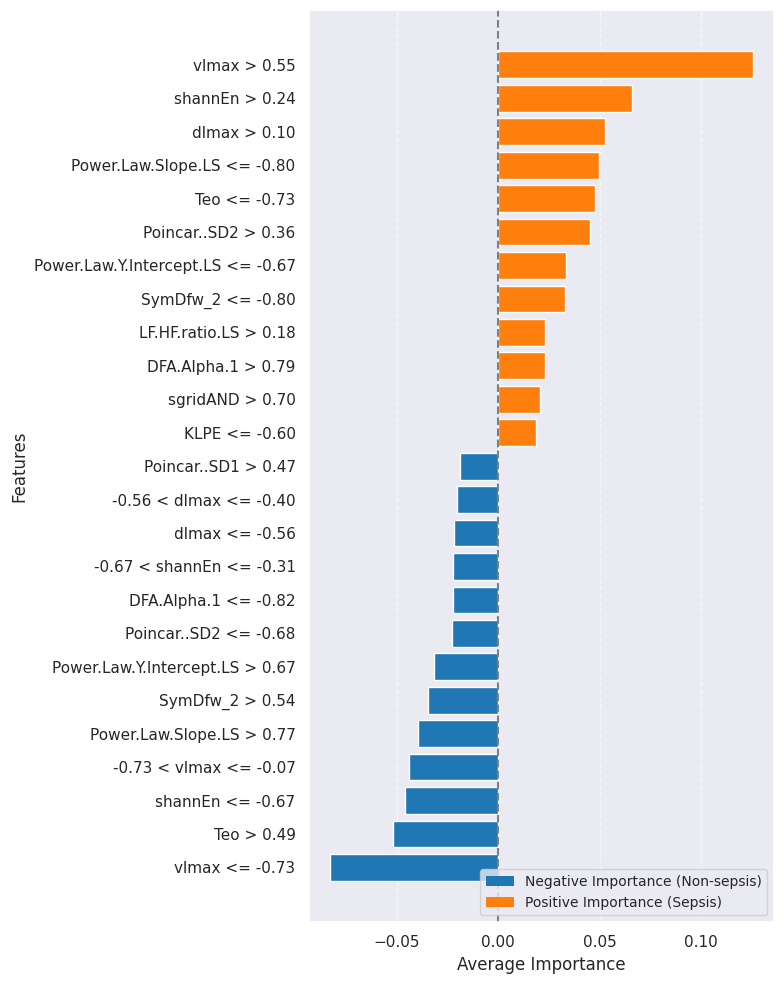

In [ ]:
import matplotlib.pyplot as plt


n = 25  # Desired number of top features to display

features = []
average_importances = []

data_lines = data_lines_neural.strip().split("\n")

for line in data_lines:
    parts = line.split(", Average Importance: ")
    feature = parts[0].replace("Feature: ", "")
    importance = float(parts[1])
    features.append(feature)
    average_importances.append(importance)

abs_importances = [abs(imp) for imp in average_importances]

combined_data = list(zip(features, average_importances, abs_importances))

top_combined_data = sorted(combined_data, key=lambda x: x[2], reverse=True)[:n]

top_features, top_importances, _ = zip(*top_combined_data)

importances_sorted, features_sorted = zip(*sorted(zip(top_importances, top_features)))


plt.figure(figsize=(8, 10))
colors = ['#1f77b4' if imp < 0 else '#ff7f0e' for imp in importances_sorted]  # Blue for negative, Orange for positive
plt.barh(features_sorted, importances_sorted, color=colors)
plt.xlabel("Average Importance", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.axvline(x=0, color='grey', linestyle='--')
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Updated legend with descriptive labels and larger font size
red_bar = plt.Rectangle((0,0),1,1,fc="#1f77b4", edgecolor = 'none')
green_bar = plt.Rectangle((0,0),1,1,fc='#ff7f0e', edgecolor = 'none')
plt.legend([red_bar, green_bar], ['Negative Importance (Non-sepsis)', 'Positive Importance (Sepsis)'], loc='lower right', ncol=1, prop={'size':10})

plt.tight_layout()
plt.savefig("Fig8-Explain_Neural_Network.png", format='png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
X_test.shape

(1079, 41)

# Neural Network with Boruta Boot Features

In [ ]:
X = new_df[boruta_bootstrap_features_sepsis3]
y = new_df['Sepsis3']
X_scaled, y = normalize_data(X, y)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, train_size=0.75, stratify=y, random_state=0)

In [ ]:
def precision(y_true, y_pred):
  y_pred = tf.cast(tf.math.greater_equal(y_pred, 0.5), tf.float32)
  tp = tf.cast(tf.logical_and(y_true == 1, y_pred == 1), tf.float32)
  fp = tf.cast(tf.logical_and(y_true == 0, y_pred == 1), tf.float32)
  return tf.reduce_sum(tp) / (tf.reduce_sum(tp) + tf.reduce_sum(fp) + 1e-4)

In [ ]:
def recall(y_true, y_pred):
  y_pred = tf.cast(tf.math.greater_equal(y_pred, 0.5), tf.float32)
  tp = tf.cast(tf.logical_and(y_true == 1, y_pred == 1), tf.float32)
  fn = tf.cast(tf.logical_and(y_true == 1, y_pred == 0), tf.float32)
  return tf.reduce_sum(tp) / (tf.reduce_sum(tp) + tf.reduce_sum(fn) + 1e-4)

In [ ]:
def f1(y_true, y_pred):
  return 2 * precision(y_true, y_pred) * recall(y_true, y_pred) / (precision(y_true, y_pred) + recall(y_true, y_pred))

In [ ]:
# Simple Neural Network Model (NN)
from tensorflow.keras import initializers
from tensorflow.keras.initializers import GlorotNormal
# Create the NN and fit it to the training data
hidden_units = 64
dropout_rate = 0.4

layers_dimensions = [hidden_units,hidden_units,hidden_units,hidden_units]
initializer = initializers.GlorotNormal(seed=2)
model_nn = keras.Sequential([
                            BatchNormalization(input_shape=[X_train.shape[1]]),
                            Dense(layers_dimensions[0],kernel_initializer=initializer,bias_initializer='zeros'),
                            BatchNormalization(),
                            Activation("relu"),
                            Dropout(rate=dropout_rate),
                            Dense(layers_dimensions[1],kernel_initializer=initializer,bias_initializer='zeros'),
                            BatchNormalization(),
                            Activation("relu"),
                            Dropout(rate=dropout_rate),
                            Dense(layers_dimensions[2],kernel_initializer=initializer,bias_initializer='zeros'),
                            BatchNormalization(),
                            Activation("relu"),
                            Dropout(rate=dropout_rate),


                            Dense(layers_dimensions[3],kernel_initializer=initializer,bias_initializer='zeros'),
                            BatchNormalization(),
                            Activation("relu"),



                            Dense(1,kernel_initializer=initializer,bias_initializer='zeros'),


                            Activation("sigmoid"),


])

optimizer = optimizers.Adam(learning_rate=5e-3)

model_nn.compile(optimizer="adam",loss="binary_crossentropy", metrics=[precision, recall, f1])

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

model_checkpoint = ModelCheckpoint(
    'best_model.h5', # Specify the path to save your model
    monitor='val_f1',                    # Monitor the validation F1 score
    mode='max',                          # The mode 'max' means the training will save the model when there's an increase
    save_best_only=True,                 # Only save a model when 'val_f1' has improved
    verbose=1)                           # Prints out messages when a model is being saved

In [ ]:
from sklearn.utils import class_weight

# Calculate the weights for each class
weights = class_weight.compute_sample_weight(class_weight='balanced', y=y_train)
class_weights = {i: weights[i] for i in range(len(weights))}

early_stopping = callbacks.EarlyStopping(monitor="val_f1", mode="max", min_delta=0.001, patience=550, restore_best_weights=True)

history_nn=model_nn.fit(
    x=X_train,
    y=y_train,
    batch_size=64,
    epochs=1400,
    verbose=2,
    validation_data = [X_test,y_test],
    callbacks=[early_stopping],
    class_weight=class_weights
)



Epoch 1/1400
51/51 - 1s - loss: 0.0620 - precision: 0.8644 - recall: 0.8160 - f1: 0.8306 - val_loss: 0.1719 - val_precision: 0.8606 - val_recall: 0.7305 - val_f1: 0.7762 - 530ms/epoch - 10ms/step
Epoch 2/1400
51/51 - 0s - loss: 0.0644 - precision: 0.8488 - recall: 0.7844 - f1: 0.8050 - val_loss: 0.1681 - val_precision: 0.8810 - val_recall: 0.6917 - val_f1: 0.7571 - 385ms/epoch - 8ms/step
Epoch 3/1400
51/51 - 0s - loss: 0.0632 - precision: 0.8610 - recall: 0.7935 - f1: 0.8142 - val_loss: 0.1730 - val_precision: 0.8560 - val_recall: 0.7204 - val_f1: 0.7673 - 398ms/epoch - 8ms/step
Epoch 4/1400
51/51 - 0s - loss: 0.0629 - precision: 0.8334 - recall: 0.8123 - f1: 0.8134 - val_loss: 0.1743 - val_precision: 0.8603 - val_recall: 0.6869 - val_f1: 0.7503 - 431ms/epoch - 8ms/step
Epoch 5/1400
51/51 - 0s - loss: 0.0694 - precision: 0.8256 - recall: 0.7577 - f1: nan - val_loss: 0.1718 - val_precision: 0.8701 - val_recall: 0.6869 - val_f1: 0.7530 - 420ms/epoch - 8ms/step
Epoch 6/1400
51/51 - 0s - l

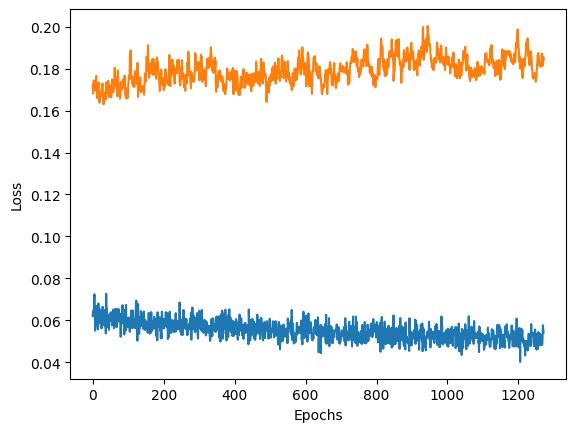

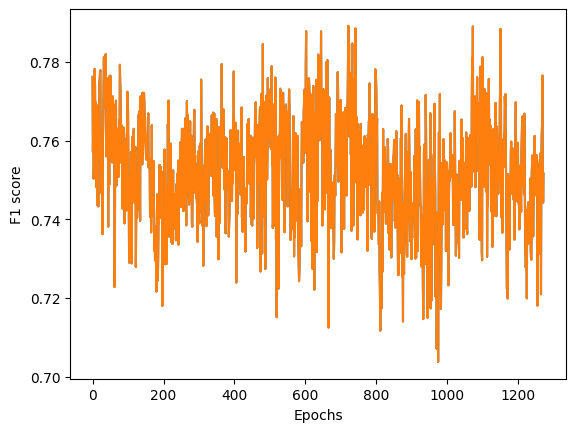

In [ ]:
history_nn_pd = pd.DataFrame(history_nn.history)
plt.plot(history_nn_pd["loss"])
plt.plot(history_nn_pd["val_loss"])
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

plt.plot(history_nn_pd["val_f1"])
plt.plot(history_nn_pd["val_f1"])
plt.xlabel("Epochs")
plt.ylabel("F1 score")
plt.show()

34/34 [==============================] - 0s 3ms/step
Neural Network Performance on Training Data:
Accuracy:  0.9545875810936052
F1 Score:  0.8016194331983806
Precision:  0.8839285714285714
Recall:  0.7333333333333333
Confusion Matrix: 


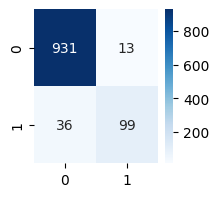

In [ ]:
y_pred = model_nn.predict(X_test)
y_pred = y_pred.reshape(-1)
y_pred = y_pred >= 0.5
print("Neural Network Performance on Training Data:")
print("Accuracy: ", accuracy_score(y_test, y_pred))
print("F1 Score: ", f1_score(y_test, y_pred))
print("Precision: ", precision_score(y_test, y_pred))
print("Recall: ", recall_score(y_test, y_pred))
print("Confusion Matrix: ")
plt.figure(figsize=(2, 2))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d',cmap='Blues')
plt.show()

# Save the Dataframe for graphing

In [ ]:
pd.DataFrame(history_nn_pd).to_csv("neural_net_80_85_76.csv")

In [ ]:
# Save the model to a file
model_save_path = 'neural_net_80_85_76_f1_pre_recall.h5' # After 400 epoch
model_nn.save(model_save_path)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
import pandas as pd

# Load the CSV file into a pandas DataFrame
df_nn_history = pd.read_csv("neural_net_80_85_76.csv")

# Display the first few rows of the DataFrame
print(df_nn_history.head())

   Unnamed: 0      loss  precision    recall  f1  val_loss  val_precision  \
0           0  0.288005   0.226605  0.200778 NaN  0.520731       0.555916   
1           1  0.208794   0.392132  0.096877 NaN  0.384991       0.648558   
2           2  0.188597   0.578073  0.163089 NaN  0.313290       0.679114   
3           3  0.183974   0.460104  0.128626 NaN  0.281384       0.680235   
4           4  0.177979   0.540666  0.237611 NaN  0.261832       0.706143   

   val_recall    val_f1  
0    0.493065  0.508936  
1    0.425442  0.486918  
2    0.471653  0.528307  
3    0.478189  0.532496  
4    0.425950       NaN  


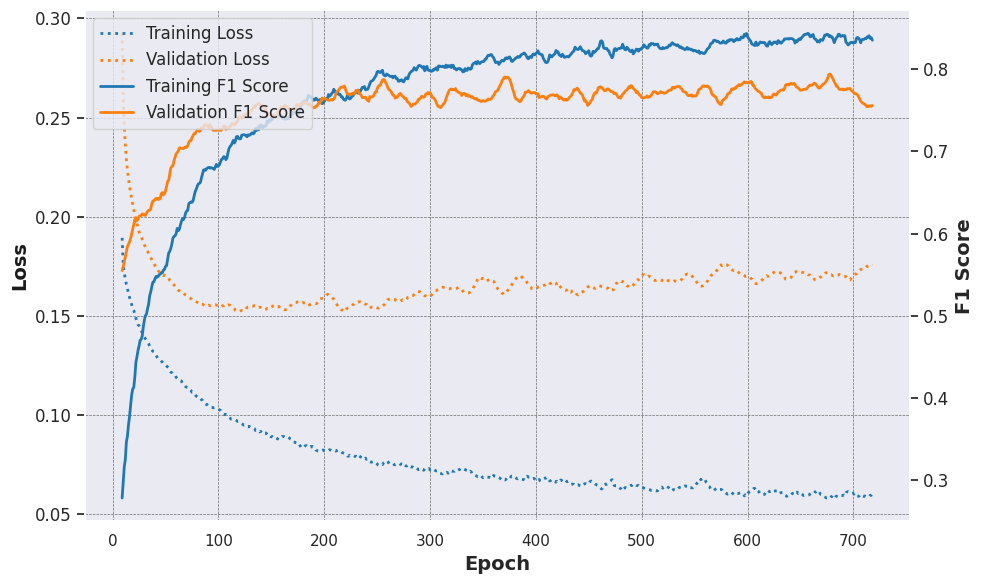

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_metrics(df, window_size=10):
    # Calculate F1 Scores for training and validation
    df['f1_score_training'] = (2 * df['precision'] * df['recall']) / (df['precision'] + df['recall'])
    df['f1_score_validation'] = (2 * df['val_precision'] * df['val_recall']) / (df['val_precision'] + df['val_recall'])

    # Apply smoothing with a rolling window
    df['loss_smooth'] = df['loss'].rolling(window=window_size).mean()
    df['val_loss_smooth'] = df['val_loss'].rolling(window=window_size).mean()
    df['f1_score_training_smooth'] = df['f1_score_training'].rolling(window=window_size).mean()
    df['f1_score_validation_smooth'] = df['f1_score_validation'].rolling(window=window_size).mean()

    # Creating plot
    fig, ax1 = plt.subplots(figsize=(10, 6))  # Adjust figsize as needed for paper width

    # Color and style adjustments
    color_train = '#1f77b4'  # Blue for training
    color_val = '#ff7f0e'    # Orange for validation
    line_thickness = 2  # Slightly thicker lines for better readability

    # Labels and title adjustments for improved clarity
    ax1.set_xlabel('Epoch', fontsize=14, fontweight='bold')
    ax1.set_ylabel('Loss', fontsize=14, fontweight='bold', color='k')
    ax1.plot(df.index, df['loss_smooth'], label='Training Loss', color=color_train, linestyle=':', linewidth=line_thickness)
    ax1.plot(df.index, df['val_loss_smooth'], label='Validation Loss', linestyle=':', color=color_val, linewidth=line_thickness)
    ax1.tick_params(axis='y', labelsize=12)

    # Twin axis for F1 Score
    ax2 = ax1.twinx()
    ax2.set_ylabel('F1 Score', fontsize=14, fontweight='bold')
    ax2.plot(df.index, df['f1_score_training_smooth'], label='Training F1 Score', color=color_train, linewidth=line_thickness)
    ax2.plot(df.index, df['f1_score_validation_smooth'], label='Validation F1 Score', linestyle='-', color=color_val, linewidth=line_thickness)
    ax2.tick_params(axis='y', labelsize=12)

    # Adding and customizing legends
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc='upper left', fontsize=12)

    # Enhancing grid visibility
    ax1.grid(True, which='both', linestyle='--', linewidth=0.5, color='dimgray')

    # Display and save the plot
    plt.tight_layout()
    plt.savefig("Fig6-Training_NN.png",format='png', dpi=300, bbox_inches='tight')
    plt.show()




plot_metrics(df_nn_history)

# Save the Model

In [ ]:
history = model.fit()
pd.DataFrame(history.history).to_csv("name.csv")
#tune the dropout value

Neural Network Performance on Training Data:
Accuracy:  0.9518072289156626
F1 Score:  0.7999999999999999
Precision:  0.832
Recall:  0.7703703703703704

923 21 31 104


In [ ]:
from keras.models import load_model

# Save the model to a file
model_save_path = 'model_nn_80_85_76_f1_pre_recall.h5' # After 500 epoch
model_nn.save(model_save_path)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [ ]:
# Load the model from the file
loaded_model = load_model(model_save_path)



In [ ]:

y_pred = loaded_model.predict(X_test)
y_pred = y_pred.reshape(-1)
y_pred = y_pred >= 0.5

34/34 [==============================] - 1s 4ms/step
